In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn import metrics
import statsmodels.api as sm
import statsmodels.formula.api as smf
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_auc_score ,roc_curve,auc
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from collections import Counter
import numpy as np
from sklearn.model_selection import GridSearchCV,StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix,precision_recall_fscore_support,accuracy_score
from sklearn import tree
import xgboost as xgb
from sklearn.tree import DecisionTreeClassifier
from sklearn import preprocessing
from sklearn.neural_network import MLPClassifier
import seaborn as sn
from sklearn.metrics import confusion_matrix

import warnings
warnings.simplefilter('ignore')
from google.colab import drive 
drive.mount('/content/drive')

/usr/local/lib/python3.7/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


Mounted at /content/drive


In [ ]:
from numpy import set_printoptions
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.decomposition import PCA
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from sklearn.inspection import permutation_importance


from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

from numpy import set_printoptions
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif

from sklearn.decomposition import PCA
from sklearn.ensemble import ExtraTreesClassifier

import operator
from collections import Counter

In [ ]:
cd /content/drive/My\ Drive/Cast_Project/

/content/drive/My Drive/Cast_Project


In [ ]:
classification_file=pd.read_csv('Features.csv', index_col=None)
classification_file.drop("index", axis=1, inplace =True)
classification_file.shape
# classification_file.head()

(2465, 76)

In [ ]:
classification_file_2 = classification_file[['Level',  
                                             'wordtypes', 'swordtypes','lextypes', 'slextypes', 'wordtokens', 'swordtokens', 'lextokens','slextokens', 'ld', 'ls1', 'ls2', 
                                             'vs1', 'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr', 'cttr', 
                                             'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2', 'nv', 'adjv' , 'advv', 'modv', 
                                              'Level0', 'Level1', 'Level2','Level3', 'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel']]
type(classification_file_2)
classification_file_2.shape

(2465, 43)

In [ ]:
classification_file_2 = classification_file_2.dropna(subset= ['Level',  
                                             'wordtypes', 'swordtypes','lextypes', 'slextypes', 'wordtokens', 'swordtokens', 'lextokens','slextokens', 'ld', 'ls1', 'ls2', 
                                             'vs1', 'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr', 'cttr', 
                                             'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2', 'nv', 'adjv' , 'advv', 'modv', 
                                              'Level0', 'Level1', 'Level2','Level3', 'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel'])
classification_file_2 = classification_file_2.reset_index(drop=True)
type(classification_file_2)
classification_file_2.head()
classification_file_2.shape

(2086, 43)

In [ ]:
classification_file_2["Level"].unique()
print(Counter(classification_file_2["Level"]))

Counter({'I': 114, 'H': 111, 'aa': 99, 'C': 98, 'A': 97, 'B': 97, 'F': 93, 'J': 91, 'Q': 88, 'D': 86, 'S': 85, 'Z': 82, 'G': 80, 'T': 77, 'E': 76, 'R': 75, 'V': 70, 'X': 67, 'Y': 65, 'P': 62, 'U': 60, 'O': 58, 'L': 52, 'W': 50, 'M': 47, 'K': 46, 'N': 45, 'Z2': 12, 'Z1': 3})


In [ ]:
# index_names = classification_file_2[ classification_file_2['Level'] == 'F' ].index  #Dropped because of less amount of samples
# classification_file_2.drop(index_names, inplace = True)
# classification_file_2 = classification_file_2.reset_index(drop=True)
# classification_file_2.shape
# classification_file_2.to_csv('feature_checking.csv',index=False)

In [ ]:
classification_file_2["Level"] = classification_file_2["Level"].astype(str)
le = preprocessing.LabelEncoder()
le.fit(classification_file_2['Level'])
classification_file_2["Level_en"] = pd.Series(le.transform(classification_file_2['Level']))   # label encoded
classification_file_2 = classification_file_2.dropna(subset= ["Level_en"])
classification_file_2 = classification_file_2[~classification_file_2.isin(['NaN']).any(axis =1)]
classification_file_2.drop("Level", axis=1, inplace =True)
classification_file_2.head()

,wordtypes,swordtypes,lextypes,slextypes,wordtokens,swordtokens,lextokens,slextokens,ld,ls1,ls2,vs1,vs2,cvs1,ndw,ndwz,ndwerz,ndwesz,ttr,msttr,cttr,rttr,logttr,uber,lv,vv1,svv1,cvv1,vv2,nv,adjv,advv,modv,Level0,Level1,Level2,Level3,Level4,Level5,Level6,Level7,MeanLevel,Level_en
0,33,8,20,8,64,17,39,17,0.61,0.44,0.24,0.07,0.07,0.19,33,22,27.6,27.1,0.52,0.44,2.92,4.12,0.84,11.34,0.51,0.36,1.79,0.94,0.13,0.60,0.00,0.00,0.00,8,0,0,1,0,0,0,2,17.0,0
1,11,6,9,6,32,6,16,6,0.50,0.38,0.55,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,0.56,0.00,0.00,0.00,0.00,0.12,0.50,0.00,0.50,8,0,0,0,0,0,0,0,0.0,0
2,30,4,19,4,57,13,28,13,0.49,0.46,0.13,0.00,0.00,0.00,30,24,26.4,26.4,0.53,0.48,2.81,3.97,0.84,11.06,0.68,1.00,4.00,1.41,0.14,0.47,0.21,0.04,0.25,12,0,0,0,0,0,0,0,0.0,0
3,34,7,22,7,51,14,29,14,0.57,0.48,0.21,0.18,0.36,0.43,34,33,33.3,33.4,0.67,0.66,3.37,4.76,0.90,16.56,0.76,1.00,11.00,2.35,0.38,0.56,0.07,0.00,0.07,7,0,1,1,0,1,0,0,5.0,0
4,11,7,8,7,32,7,8,7,0.25,0.88,0.64,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,8,0,0,0,0,0,0,0,0.0,0


In [ ]:
classification_file_2["sum"] = classification_file_2[['Level0', 'Level1', 'Level2','Level3', 'Level4', 'Level5', 'Level6', 'Level7']].sum(axis =1)
classification_file_2["Level0_rf"] = classification_file_2["Level0"].div(classification_file_2['sum']).astype(np.float32)
classification_file_2["Level1_rf"] = classification_file_2["Level1"].div(classification_file_2['sum']).astype(np.float32)
classification_file_2["Level2_rf"] = classification_file_2["Level2"].div(classification_file_2['sum']).astype(np.float32)
classification_file_2["Level3_rf"] = classification_file_2["Level3"].div(classification_file_2['sum']).astype(np.float32)
classification_file_2["Level4_rf"] = classification_file_2["Level4"].div(classification_file_2['sum']).astype(np.float32)
classification_file_2["Level5_rf"] = classification_file_2["Level5"].div(classification_file_2['sum']).astype(np.float32)
classification_file_2["Level6_rf"] = classification_file_2["Level6"].div(classification_file_2['sum']).astype(np.float32)
classification_file_2["Level7_rf"] = classification_file_2["Level7"].div(classification_file_2['sum']).astype(np.float32)
classification_file_2.tail()

,wordtypes,swordtypes,lextypes,slextypes,wordtokens,swordtokens,lextokens,slextokens,ld,ls1,ls2,vs1,vs2,cvs1,ndw,ndwz,ndwerz,ndwesz,ttr,msttr,cttr,rttr,logttr,uber,lv,vv1,svv1,cvv1,vv2,nv,adjv,advv,modv,Level0,Level1,Level2,Level3,Level4,Level5,Level6,Level7,MeanLevel,Level_en,sum,Level0_rf,Level1_rf,Level2_rf,Level3_rf,Level4_rf,Level5_rf,Level6_rf,Level7_rf
2081,32,3,21,3,43,4,22,4,0.51,0.18,0.09,0.33,0.67,0.58,32,32,32.0,32.0,0.74,0.74,3.45,4.88,0.92,20.79,0.95,1.00,6.0,1.73,0.27,1.00,0.09,0.0,0.09,10,0,1,1,0,0,0,0,3.5,28,12,0.833333,0.0,0.083333,0.083333,0.0,0.0,0.000000,0.0
2082,34,6,20,6,60,7,34,7,0.57,0.21,0.18,0.00,0.00,0.00,34,30,29.6,31.0,0.57,0.60,3.10,4.39,0.86,12.82,0.59,0.75,4.5,1.50,0.18,0.85,0.09,0.0,0.09,10,0,1,1,0,0,1,0,4.0,28,13,0.769231,0.0,0.076923,0.076923,0.0,0.0,0.076923,0.0
2083,10,7,9,7,17,7,9,7,0.53,0.78,0.70,0.00,0.00,0.00,10,10,10.0,10.0,0.59,0.59,1.71,2.43,0.81,0.00,1.00,0.00,0.0,0.00,0.00,1.00,0.00,0.0,0.00,8,0,0,0,0,0,0,0,0.0,28,8,1.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0
2084,31,8,21,8,51,17,32,17,0.63,0.53,0.26,0.00,0.00,0.00,31,31,30.4,31.0,0.61,0.62,3.07,4.34,0.87,13.49,0.66,1.00,5.0,1.58,0.16,0.82,0.06,0.0,0.06,9,0,0,2,0,0,0,0,3.0,28,11,0.818182,0.0,0.000000,0.181818,0.0,0.0,0.000000,0.0
2085,10,4,8,4,24,4,8,4,0.33,0.50,0.40,0.00,0.00,0.00,10,10,10.0,10.0,0.42,0.42,1.44,2.04,0.72,0.00,1.00,0.00,0.0,0.00,0.00,1.00,0.00,0.0,0.00,5,0,0,0,0,0,0,0,0.0,28,5,1.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0


In [ ]:
classification_file_2 = classification_file_2[[  
                                             'wordtypes', 'swordtypes','lextypes', 'slextypes', 'wordtokens', 'swordtokens', 'lextokens','slextokens', 'ld', 'ls1', 'ls2', 
                                             'vs1', 'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr', 'cttr', 
                                             'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2', 'nv', 'adjv' , 'advv', 'modv', 
                                              'Level0', 'Level1', 'Level2','Level3', 'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel','Level_en' ]]
type(classification_file_2)
classification_file_2.head()
# classification_file_2.shape

,wordtypes,swordtypes,lextypes,slextypes,wordtokens,swordtokens,lextokens,slextokens,ld,ls1,ls2,vs1,vs2,cvs1,ndw,ndwz,ndwerz,ndwesz,ttr,msttr,cttr,rttr,logttr,uber,lv,vv1,svv1,cvv1,vv2,nv,adjv,advv,modv,Level0,Level1,Level2,Level3,Level4,Level5,Level6,Level7,MeanLevel,Level_en
0,33,8,20,8,64,17,39,17,0.61,0.44,0.24,0.07,0.07,0.19,33,22,27.6,27.1,0.52,0.44,2.92,4.12,0.84,11.34,0.51,0.36,1.79,0.94,0.13,0.60,0.00,0.00,0.00,8,0,0,1,0,0,0,2,17.0,0
1,11,6,9,6,32,6,16,6,0.50,0.38,0.55,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,0.56,0.00,0.00,0.00,0.00,0.12,0.50,0.00,0.50,8,0,0,0,0,0,0,0,0.0,0
2,30,4,19,4,57,13,28,13,0.49,0.46,0.13,0.00,0.00,0.00,30,24,26.4,26.4,0.53,0.48,2.81,3.97,0.84,11.06,0.68,1.00,4.00,1.41,0.14,0.47,0.21,0.04,0.25,12,0,0,0,0,0,0,0,0.0,0
3,34,7,22,7,51,14,29,14,0.57,0.48,0.21,0.18,0.36,0.43,34,33,33.3,33.4,0.67,0.66,3.37,4.76,0.90,16.56,0.76,1.00,11.00,2.35,0.38,0.56,0.07,0.00,0.07,7,0,1,1,0,1,0,0,5.0,0
4,11,7,8,7,32,7,8,7,0.25,0.88,0.64,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,8,0,0,0,0,0,0,0,0.0,0


In [ ]:
classification_file_2.head()
classification_file_2.shape

(2086, 52)

In [ ]:
# ds = classification_file_2[['Level0', 'Level1', 'Level2','Level3', 'Level4', 'Level5', 'Level6', 'Level7']].isin([np.inf, -np.inf])
# type(ds['Level0'].iloc[0])

In [ ]:
# classification_file_2.shape
# # classification_file_2["sum"] = classification_file_2.iloc[:, -10:-2].sum(axis =1)
# classification_file_2["Level0_rf"] = classification_file_2["Level0"].div(classification_file_2.iloc[:, -10:-2].sum(axis =1))
# classification_file_2.tail()

In [ ]:
# df["sum"] = df.sum(axis=1)

In [ ]:
# aq = pd.Series(classification_file_2['Level0']).value_counts()      
# print(aq / len(classification_file_2['Level0']))

In [ ]:
classification_file_2_freq = classification_file_2[[  
                                             'wordtypes', 'swordtypes','lextypes', 'slextypes', 'wordtokens', 'swordtokens', 'lextokens','slextokens', 'ld', 'ls1', 'ls2', 
                                             'vs1', 'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr', 'cttr', 
                                             'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2', 'nv', 'adjv' , 'advv', 'modv', 
                                              'Level0_rf', 'Level1_rf', 'Level2_rf','Level3_rf', 'Level4_rf', 'Level5_rf', 'Level6_rf', 'Level7_rf', 'MeanLevel','Level_en' ]]
type(classification_file_2_freq)
classification_file_2_freq.head()

,wordtypes,swordtypes,lextypes,slextypes,wordtokens,swordtokens,lextokens,slextokens,ld,ls1,ls2,vs1,vs2,cvs1,ndw,ndwz,ndwerz,ndwesz,ttr,msttr,cttr,rttr,logttr,uber,lv,vv1,svv1,cvv1,vv2,nv,adjv,advv,modv,Level0_rf,Level1_rf,Level2_rf,Level3_rf,Level4_rf,Level5_rf,Level6_rf,Level7_rf,MeanLevel,Level_en
0,33,8,20,8,64,17,39,17,0.61,0.44,0.24,0.07,0.07,0.19,33,22,27.6,27.1,0.52,0.44,2.92,4.12,0.84,11.34,0.51,0.36,1.79,0.94,0.13,0.60,0.00,0.00,0.00,0.727273,0.0,0.0,0.090909,0.0,0.0,0.0,0.181818,17.0,0
1,11,6,9,6,32,6,16,6,0.50,0.38,0.55,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,0.56,0.00,0.00,0.00,0.00,0.12,0.50,0.00,0.50,1.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0
2,30,4,19,4,57,13,28,13,0.49,0.46,0.13,0.00,0.00,0.00,30,24,26.4,26.4,0.53,0.48,2.81,3.97,0.84,11.06,0.68,1.00,4.00,1.41,0.14,0.47,0.21,0.04,0.25,1.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0
3,34,7,22,7,51,14,29,14,0.57,0.48,0.21,0.18,0.36,0.43,34,33,33.3,33.4,0.67,0.66,3.37,4.76,0.90,16.56,0.76,1.00,11.00,2.35,0.38,0.56,0.07,0.00,0.07,0.700000,0.0,0.1,0.100000,0.0,0.1,0.0,0.000000,5.0,0
4,11,7,8,7,32,7,8,7,0.25,0.88,0.64,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,1.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0


In [ ]:
classification_file_2_freq_2 = classification_file_2_freq.dropna(subset= ['Level0_rf', 'Level1_rf', 'Level2_rf','Level3_rf', 'Level4_rf', 'Level5_rf', 'Level6_rf', 'Level7_rf'])
classification_file_2_freq_2.shape
classification_file_2_freq = classification_file_2_freq_2[~classification_file_2_freq_2.isin(['NaN']).any(axis =1)]
classification_file_2_freq_2.shape
classification_file_2_freq_2.head()
classification_file_2_freq_2 = classification_file_2_freq_2.reset_index(drop=True)
classification_file_2_freq_2.shape

(2085, 43)

In [ ]:
# y =  classification_file_2.Level_en.astype(int)
y =  classification_file_2_freq_2.Level_en
X =  classification_file_2_freq_2.drop('Level_en',axis=1)
scaler=StandardScaler()
scaled_X = scaler.fit_transform(X)

In [ ]:
# y =  classification_file_2.Level_en.astype(int)
y =  classification_file_2.Level_en
X =  classification_file_2.drop('Level_en',axis=1)
scaler=StandardScaler()
scaled_X = scaler.fit_transform(X)

In [ ]:
scaled_X

array([[-1.05282128, -0.91593932, -1.01843767, ..., -0.55280933,
        -0.74213229, -0.8110349 ],
       [-1.14093029, -0.93639442, -1.0719236 , ..., -0.55280933,
        -0.90450779, -1.17233083],
       [-1.06483615, -0.95684952, -1.02330003, ..., -0.55280933,
        -0.90450779, -1.17233083],
       ...,
       [-1.14493525, -0.92616687, -1.0719236 , ..., -0.55280933,
        -0.90450779, -1.17233083],
       [-1.06083119, -0.91593932, -1.01357531, ..., -0.55280933,
        -0.90450779, -1.10857272],
       [-1.14493525, -0.95684952, -1.07678595, ..., -0.55280933,
        -0.90450779, -1.17233083]])

In [ ]:
DF_list= list()

def classify(X,y,classifier): 
    kf = StratifiedKFold(n_splits=5,shuffle=True,random_state=100)
    acc_score=[]
    prec_score =[]
    f_score =[]
    reca_score =[]
    i=1
    for train_index,test_index in kf.split(X,y):
        #print('{} of KFold {}'.format(i,kf.n_splits))
        # print(train_index)
        # xtr,xvl = np.take(X, train_index), np.take(X, test_index)  #X[train_index],X[test_index]
        # ytr,yvl = np.take(y, train_index), np.take(y, test_index)  # y[train_index],y[test_index]
        xtr,xvl = X[train_index],X[test_index]
        ytr,yvl = y[train_index],y[test_index]
        # print(f"Unique training: {np.unique(ytr)}")
        # print(f"Unique validation {np.unique(yvl)}")
        #model
        clfr = classifier
        clfr.fit(xtr,ytr)
        pred2= clfr.predict(xvl) 
        Accuracy= accuracy_score(yvl, pred2)
        #confusion matrix',confusion_matrix(yvl, pred))
        recall = metrics.recall_score(yvl, pred2,average= 'macro')
        precision = metrics.precision_score(yvl, pred2,average= 'macro')
        fscore=metrics.f1_score(yvl, pred2,average= 'macro')
        # print(metrics.confusion_matrix(yvl,pred2))
        
        #print('confusion matrix',confusion_matrix(yvl, pred2))
        #print('precision_recall_fscore_support',precision_recall_fscore_support(yvl, pred2))
        acc_score.append(Accuracy)
        prec_score.append(precision)
        reca_score.append(recall)
        f_score.append(fscore)
        i+=1
    e = (sum(acc_score)/len(acc_score))
    f= (sum(prec_score)/len(prec_score))
    g=(sum(reca_score)/len(reca_score))
    h=(sum(f_score)/len(f_score))

    conf_matrix = confusion_matrix(yvl,pred2)
    df_cm = pd.DataFrame(conf_matrix)
    df_cm
    # DF_list.append(df_cm)
   
    plt.figure(figsize = (30,10))
    sn.heatmap(df_cm, annot=True)

    print(classifier,':')
    print('\033[1m'+'Average of all Precision :' +'\033[0m',f)
    print('\033[1m'+'Average of all Accuracy :' +'\033[0m',e)
    print('\033[1m'+'Average of all Recall :' +'\033[0m',g)
    print('\033[1m'+'Average of all F1-score :' +'\033[0m',h)
    return e,f,g,h
    

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=-1, oob_score=False, random_state=100, verbose=0,
                       warm_start=False) :
Average of all Precision : 0.341757370225383
Average of all Accuracy : 0.3628974332495726
Average of all Recall : 0.33284762330029366
Average of all F1-score : 0.32581034367319334
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=100, solver='lbfgs', tol=0.000

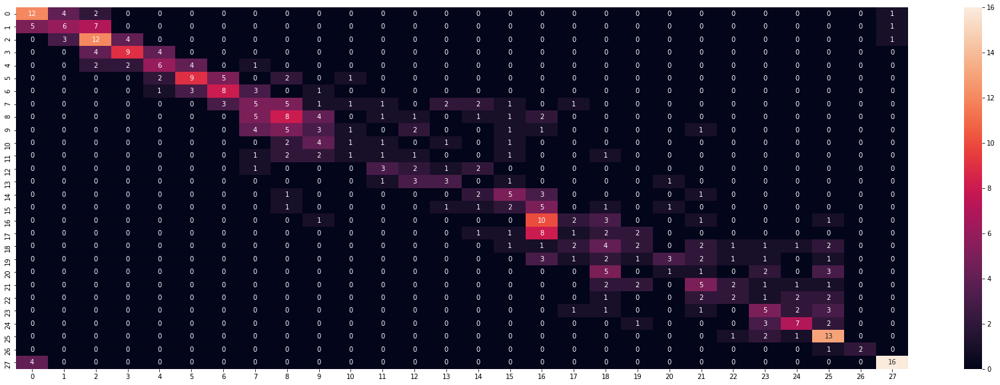

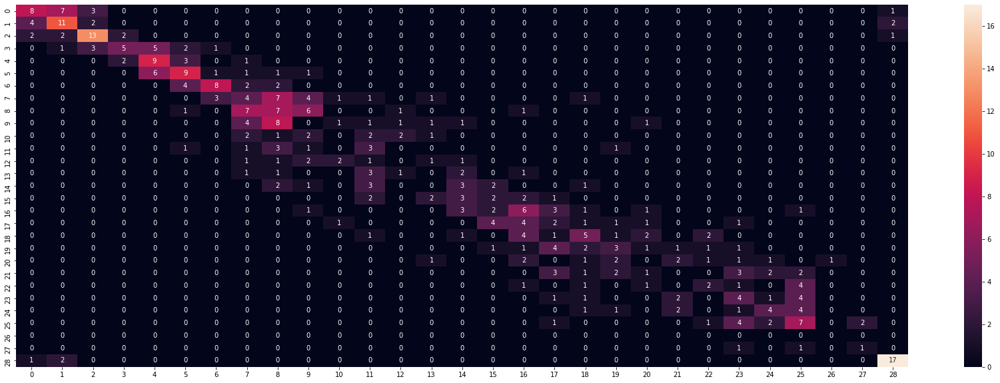

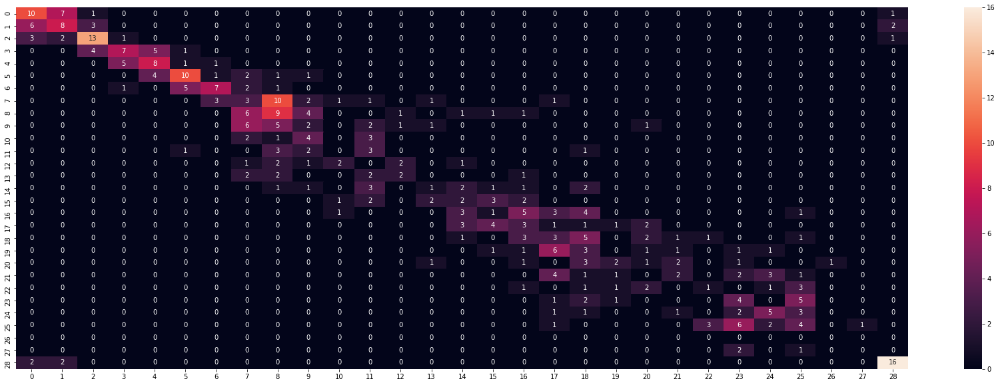

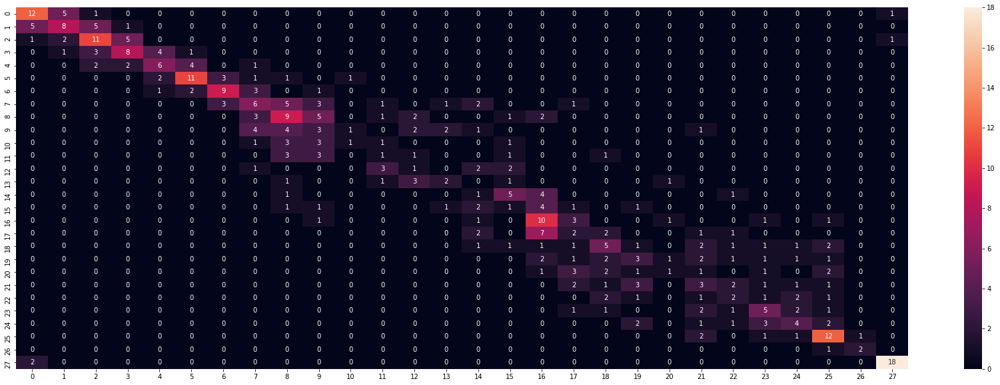

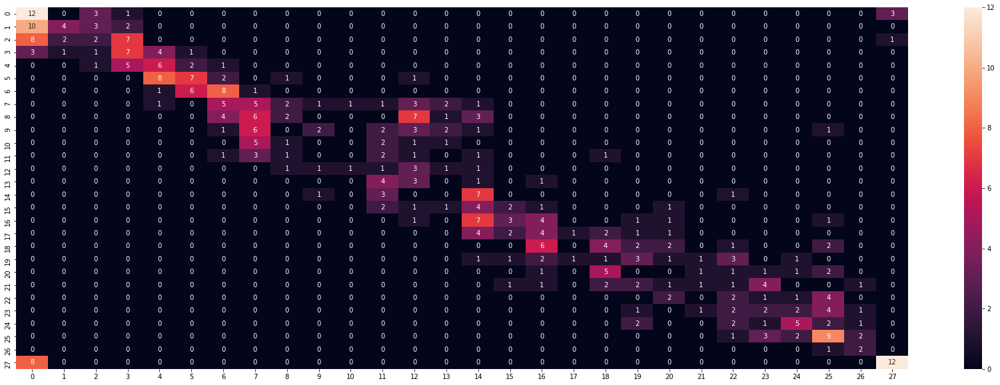

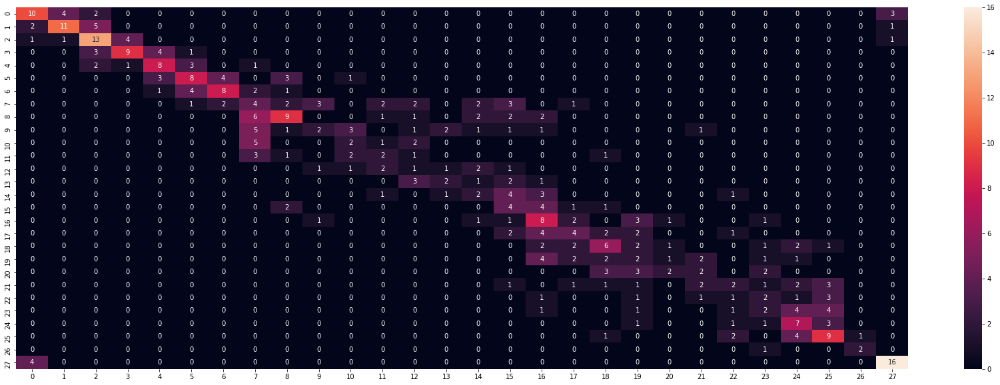

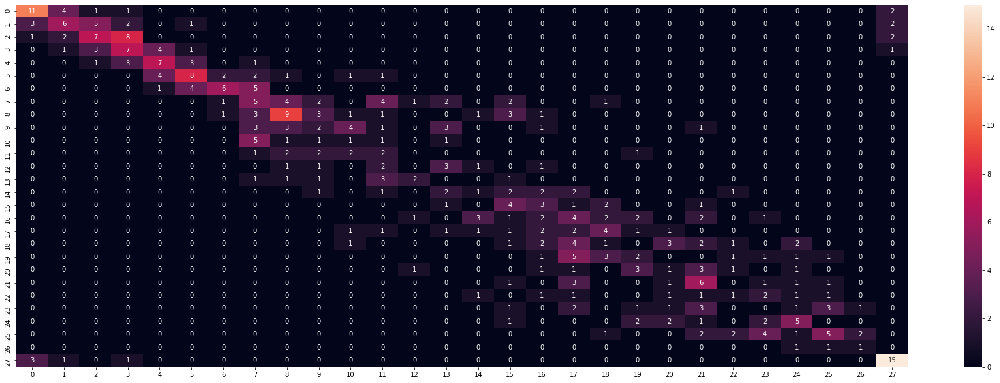

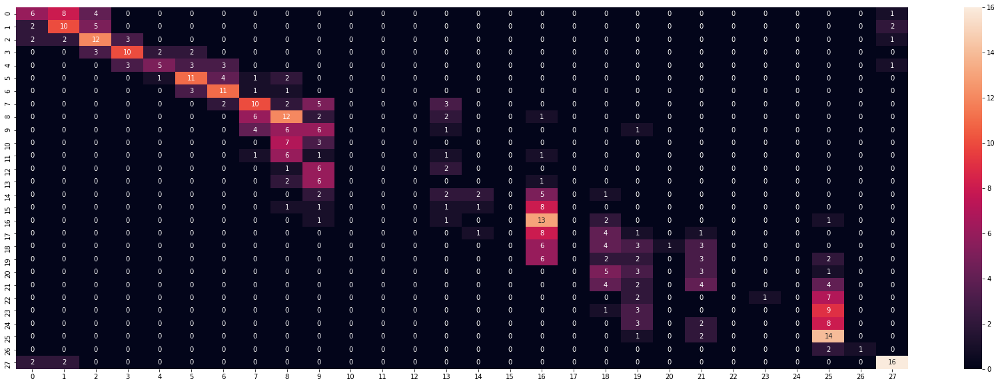

In [ ]:
def call_classify(X,y):   
    accuracy=[]
    avg_precision=[]
    recall=[]
    f_score=[]
    classifiers = [RandomForestClassifier(n_estimators=200,n_jobs=-1,random_state=100),
                   LogisticRegression(random_state=100),SVC(kernel='linear',random_state=100,probability=True),
                   ExtraTreesClassifier(n_estimators=100, random_state=100),GaussianNB(),
                   xgb.XGBClassifier(objective="binary:logistic", random_state=100), DecisionTreeClassifier(),MLPClassifier(solver='lbfgs', alpha=1e-5,
                    hidden_layer_sizes=(10, 2), random_state=1)]
    for classifier in (classifiers):
            e,f,g,h = classify(X,y,classifier)
            accuracy.append(e*100)
            avg_precision.append(f*100)
            recall.append(g*100)
            f_score.append(h*100)
    return accuracy,f_score,avg_precision,recall
classif = ['Random Forest','Logistic_regression','SVM','Extratrees classifier','GaussianNB','XGBoost','Decision Tree','MLPClassifier']        

e1,f1,g1,h1=call_classify(scaled_X,y) 

In [ ]:
result = pd.DataFrame(
    {'Classifier': classif,
     'Accuracy': e1,
     'Precision': f1,
     'Recall': g1,
     'F1-score': h1,
    })

result

,Classifier,Accuracy,Precision,Recall,F1-score
0,Random Forest,36.289743,32.581034,34.175737,33.284762
1,Logistic_regression,30.823035,26.063524,27.051689,26.732274
2,SVM,32.789577,27.295612,28.326636,27.811106
3,Extratrees classifier,36.240520,32.754278,33.890766,33.378390
4,GaussianNB,23.970030,20.599212,22.296416,23.626102
5,XGBoost,34.995238,31.401466,32.507128,31.950824
6,Decision Tree,28.906406,26.240344,26.817811,26.505600
7,MLPClassifier,29.579246,21.738819,21.819631,25.022979


## Level 0-9

In [ ]:
classification_file_0_9 = classification_file_2[classification_file_2['Level_en'].isin(['0','1','2','3','4','5','6','7','8','9'])]
print(Counter(classification_file_0_9['Level_en']))
classification_file_0_9 = classification_file_0_9.reset_index(drop=True)
type(classification_file_0_9)
classification_file_0_9.shape

Counter({8: 114, 7: 111, 2: 98, 0: 97, 1: 97, 5: 93, 9: 91, 3: 86, 6: 80, 4: 76})


(943, 43)

In [ ]:
# y =  classification_file_2.Level_en.astype(int)
y =  classification_file_0_9.Level_en
X =  classification_file_0_9.drop('Level_en',axis=1)
scaler=StandardScaler()
scaled_X = scaler.fit_transform(X)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=-1, oob_score=False, random_state=100, verbose=0,
                       warm_start=False) :
Average of all Precision : 0.5055663884639687
Average of all Accuracy : 0.48568051334008777
Average of all Recall : 0.4861941555139495
Average of all F1-score : 0.4854074262727336
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=100, solver='lbfgs', tol=0.000

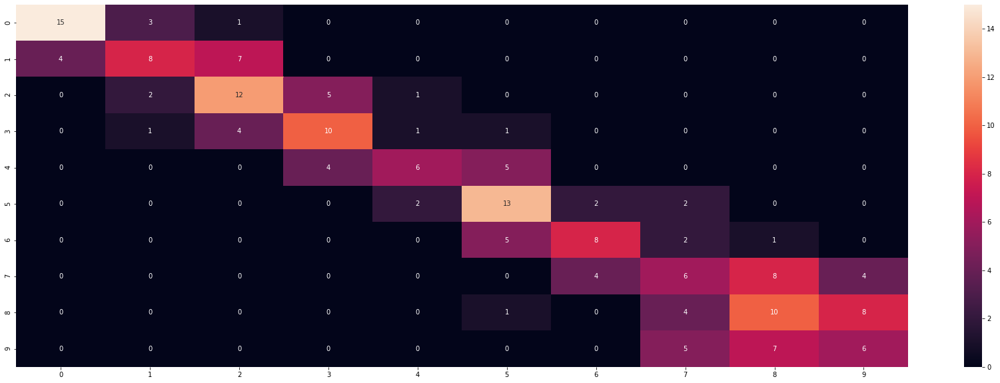

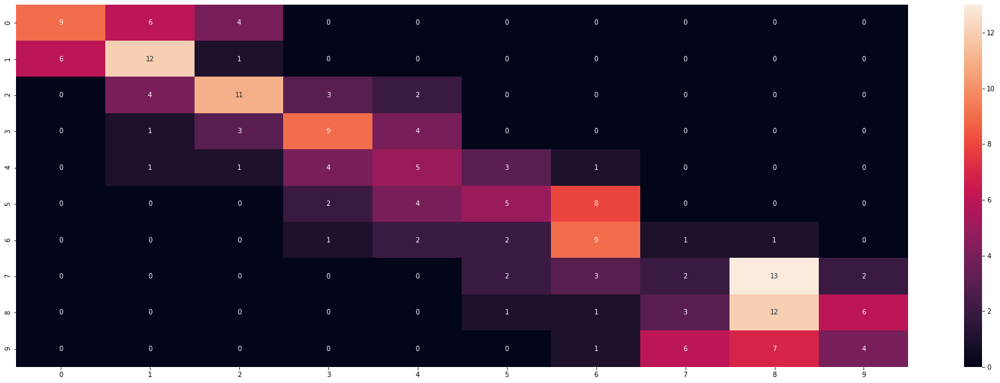

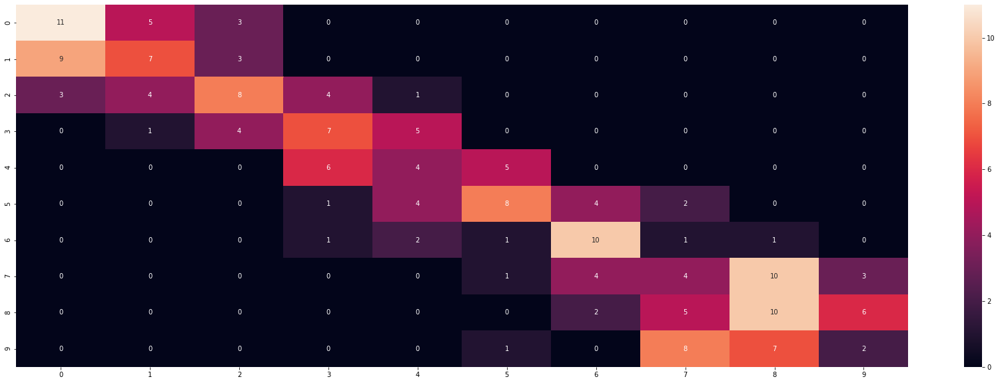

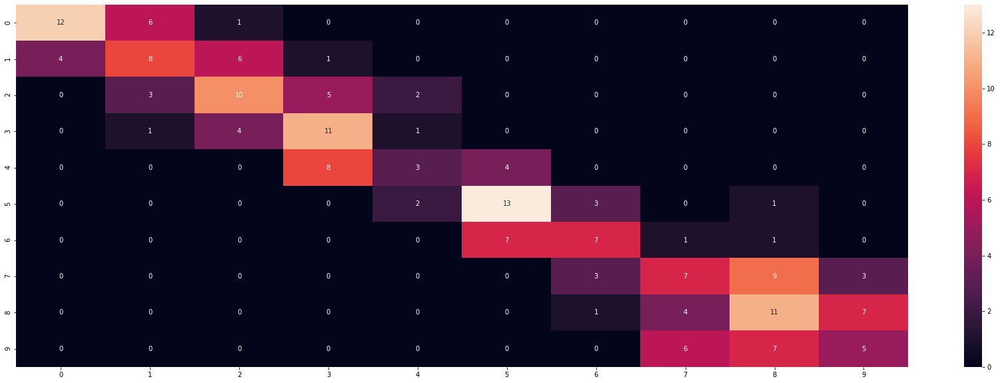

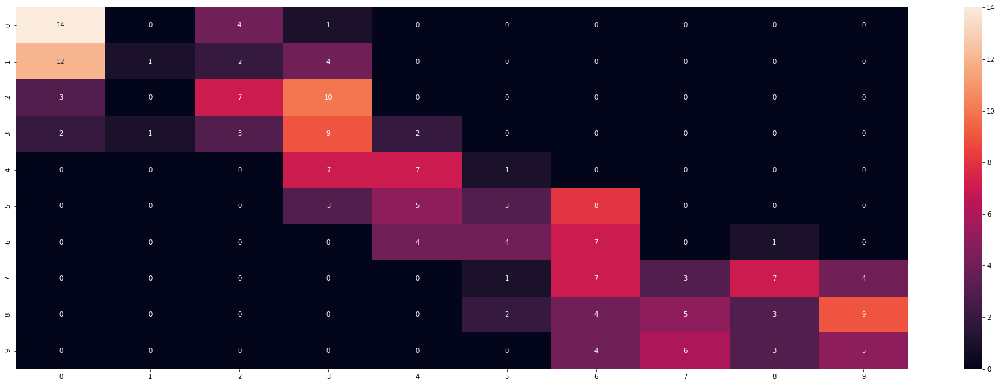

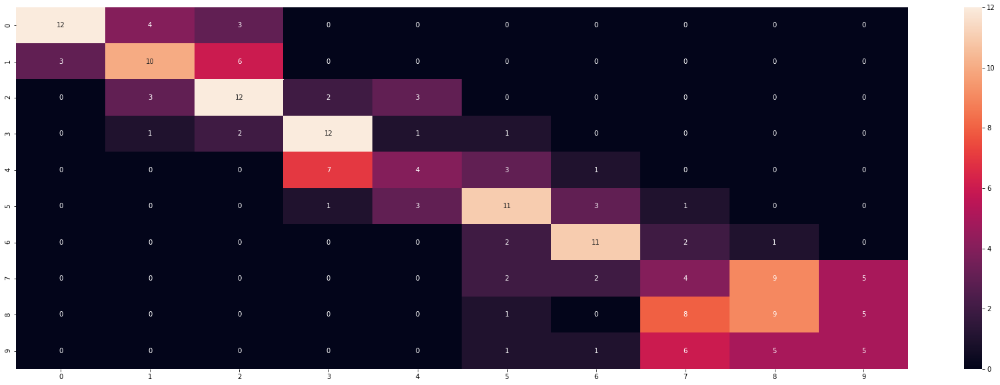

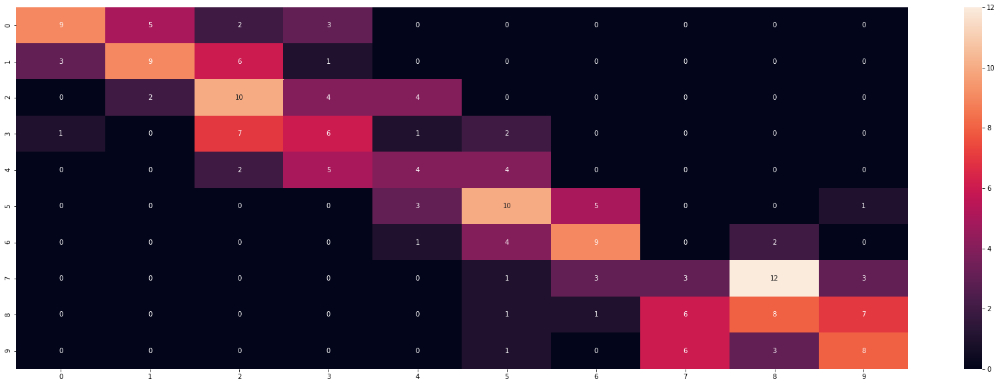

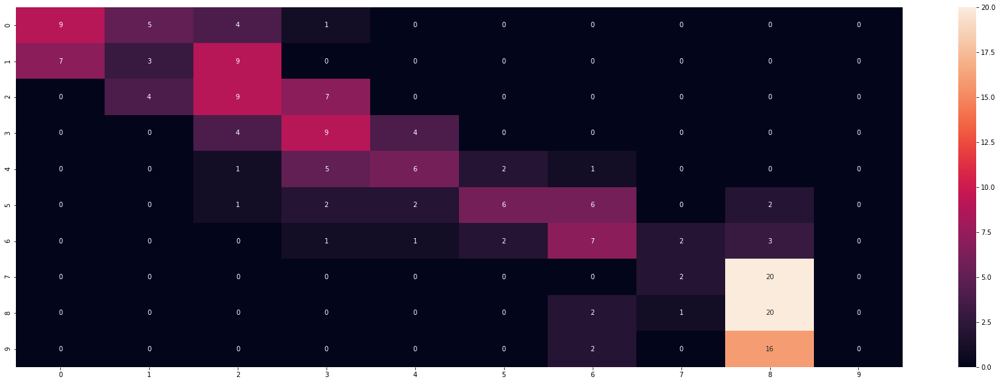

In [ ]:
e1,f1,g1,h1=call_classify(scaled_X,y) 


In [ ]:
result_0_9 = pd.DataFrame(
    {'Classifier': classif,
     'Accuracy': e1,
     'Precision': f1,
     'Recall': g1,
     'F1-score': h1,
    })

result_0_9

,Classifier,Accuracy,Precision,Recall,F1-score
0,Random Forest,48.568051,48.540743,50.556639,48.619416
1,Logistic_regression,42.419228,41.989660,42.753780,42.830754
2,SVM,43.372734,42.853958,43.666487,43.636841
3,Extratrees classifier,46.552403,45.919124,47.143229,46.327157
4,GaussianNB,31.066081,27.768790,29.487175,32.136275
5,XGBoost,47.294833,47.309036,48.267220,47.498655
6,Decision Tree,38.177980,38.377824,39.096438,38.490606
7,MLPClassifier,42.731059,38.263217,40.030715,42.053293


## Level 10-15

In [ ]:
classification_file_10_15 = classification_file_2[classification_file_2['Level_en'].isin(['10','11','12','13','14','15'])]
print(Counter(classification_file_10_15['Level_en']))
classification_file_10_15 = classification_file_10_15.reset_index(drop=True)
type(classification_file_10_15)
classification_file_10_15.shape

Counter({15: 62, 14: 58, 11: 52, 12: 47, 10: 46, 13: 45})


(310, 43)

In [ ]:
# y =  classification_file_2.Level_en.astype(int)
y =  classification_file_10_15.Level_en
X =  classification_file_10_15.drop('Level_en',axis=1)
scaler=StandardScaler()
scaled_X = scaler.fit_transform(X)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=-1, oob_score=False, random_state=100, verbose=0,
                       warm_start=False) :
Average of all Precision : 0.4195212563207919
Average of all Accuracy : 0.4032258064516129
Average of all Recall : 0.4014970214970215
Average of all F1-score : 0.39697983681998084
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=100, solver='lbfgs', tol=0.000

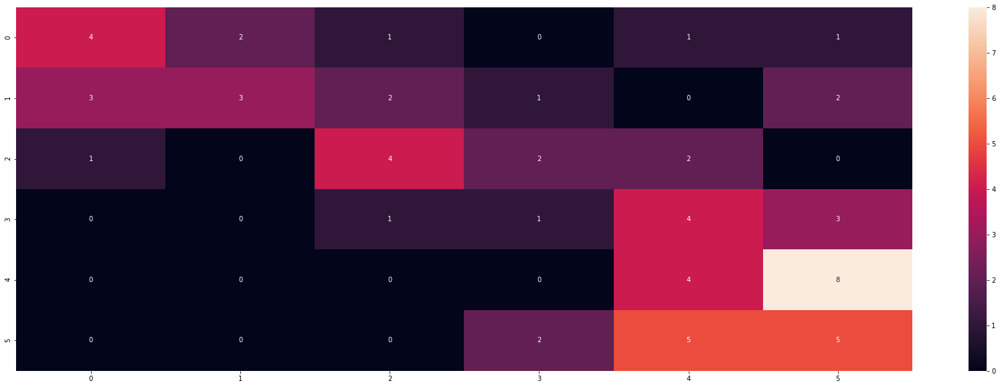

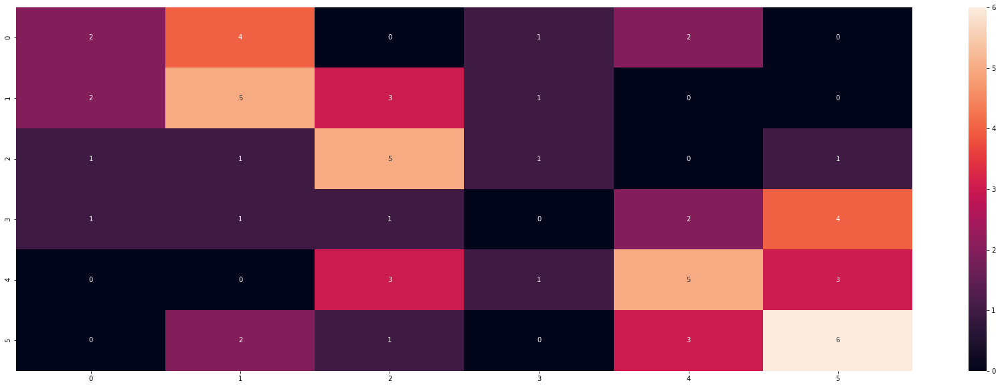

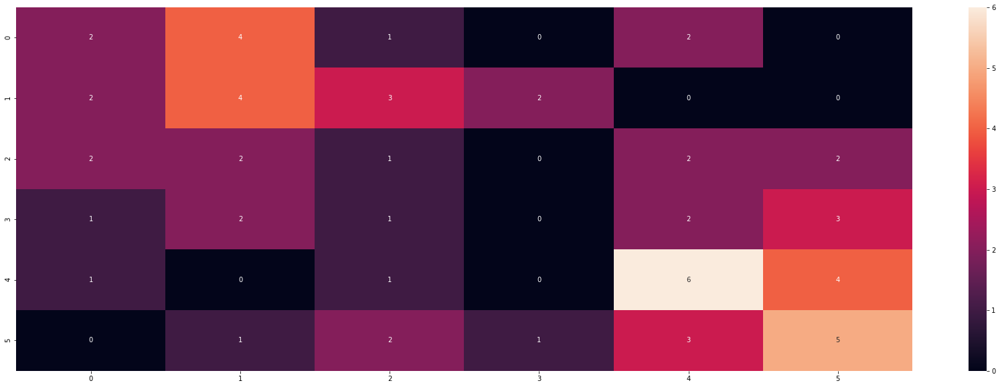

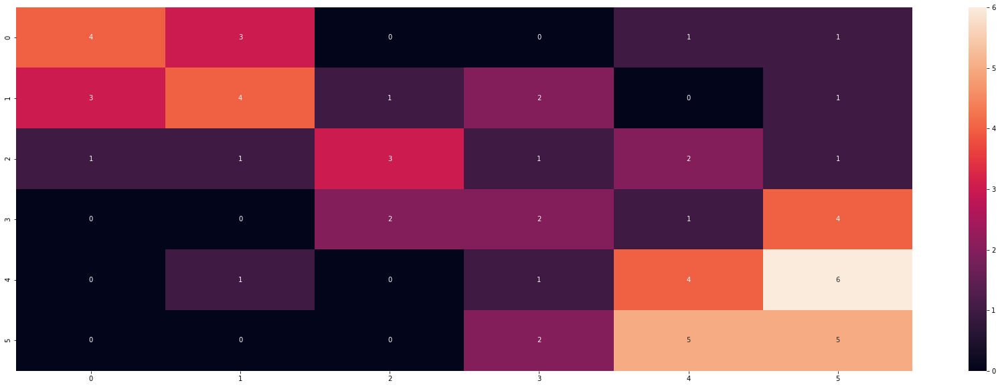

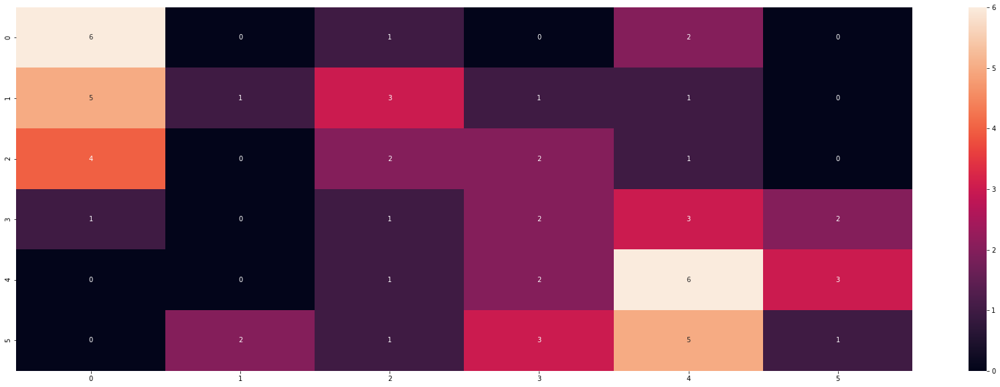

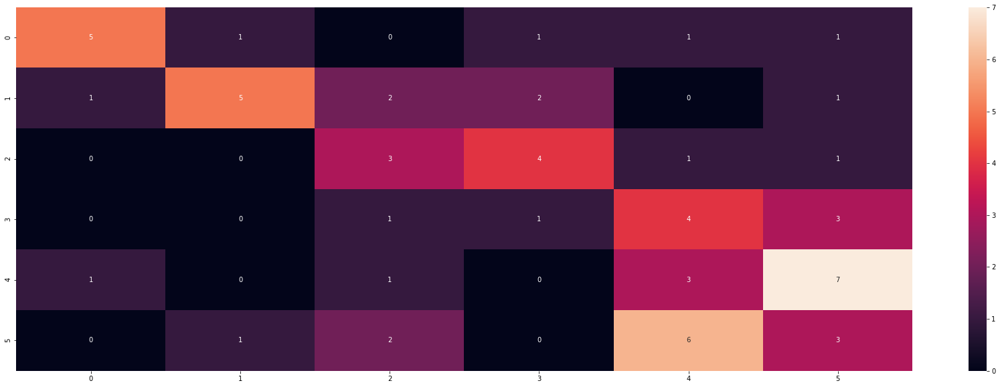

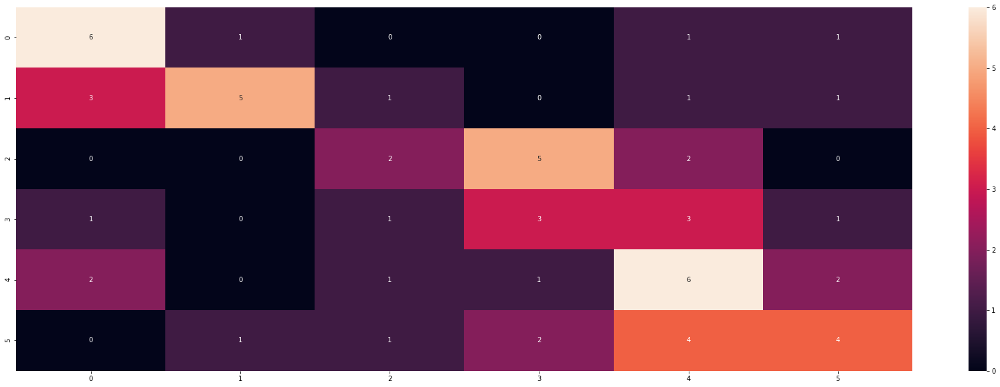

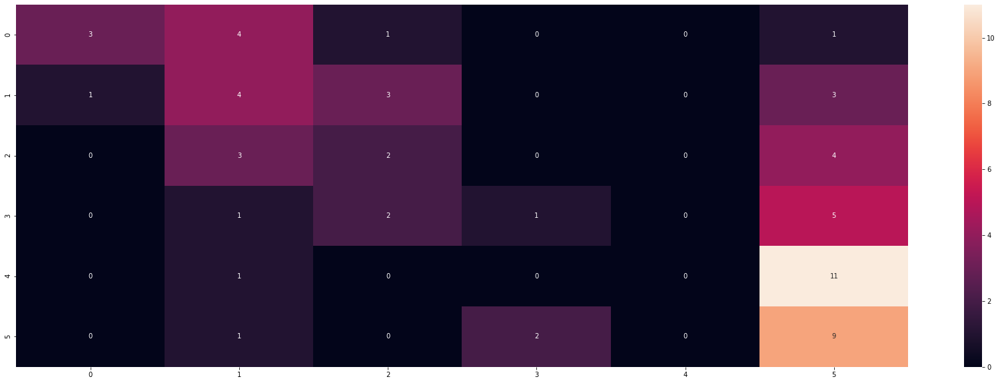

In [ ]:
e1,f1,g1,h1=call_classify(scaled_X,y) 

In [ ]:
result_10_15 = pd.DataFrame(
    {'Classifier': classif,
     'Accuracy': e1,
     'Precision': f1,
     'Recall': g1,
     'F1-score': h1,
    })

result_10_15

,Classifier,Accuracy,Precision,Recall,F1-score
0,Random Forest,40.322581,39.697984,41.952126,40.149702
1,Logistic_regression,35.483871,33.226192,36.469831,34.411163
2,SVM,31.290323,29.585877,30.231400,30.503367
3,Extratrees classifier,41.612903,41.218635,44.004339,41.285677
4,GaussianNB,34.516129,32.037752,35.751336,34.642062
5,XGBoost,39.677419,39.650397,41.830635,39.617716
6,Decision Tree,33.870968,33.290132,34.181466,33.671847
7,MLPClassifier,31.290323,26.038790,27.719331,30.220021


## Level 16-28

In [ ]:
classification_file_16_28 = classification_file_2[classification_file_2['Level_en'].isin(['16','17','18','19','20','21','22','23','24','25','27','28'])] #kept 26 out due to less features
print(Counter(classification_file_16_28['Level_en']))
classification_file_16_28 = classification_file_16_28.reset_index(drop=True)
type(classification_file_16_28)
classification_file_16_28.shape

Counter({28: 99, 16: 88, 18: 85, 25: 82, 19: 77, 17: 75, 21: 70, 23: 67, 24: 65, 20: 60, 22: 50, 27: 12})


(830, 43)

In [ ]:
# y =  classification_file_2.Level_en.astype(int)
y =  classification_file_16_28.Level_en
X =  classification_file_16_28.drop('Level_en',axis=1)
scaler=StandardScaler()
scaled_X = scaler.fit_transform(X)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=-1, oob_score=False, random_state=100, verbose=0,
                       warm_start=False) :
Average of all Precision : 0.3956858824531403
Average of all Accuracy : 0.3927710843373494
Average of all Recall : 0.37587499102204985
Average of all F1-score : 0.36925015922309246
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=100, solver='lbfgs', tol=0.00

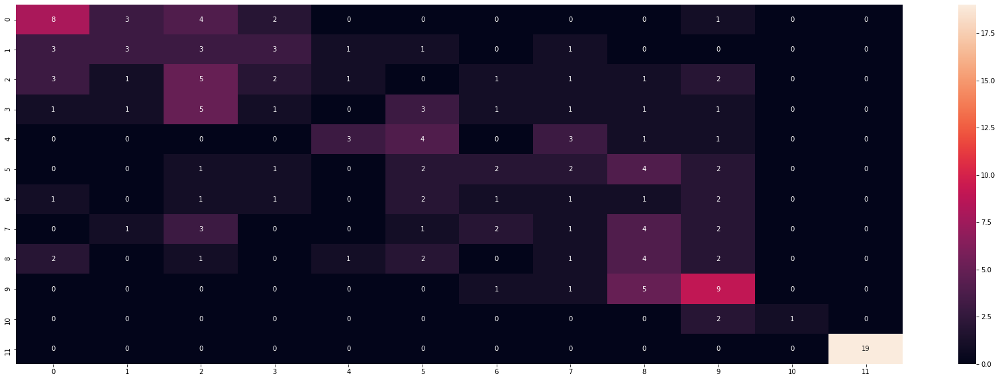

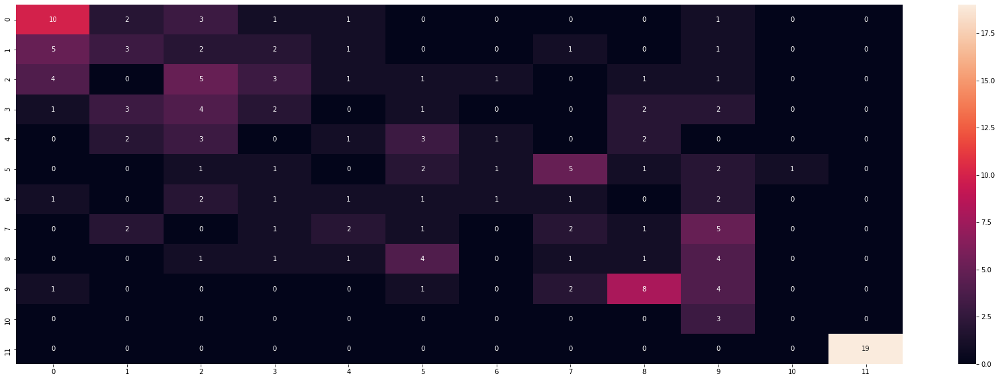

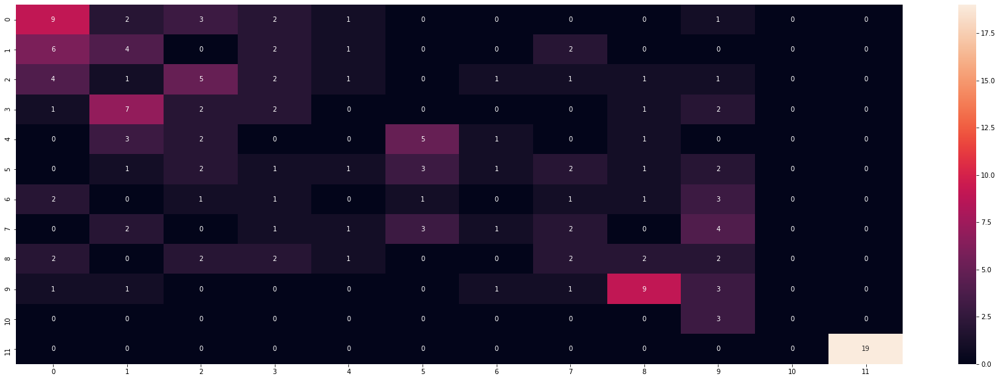

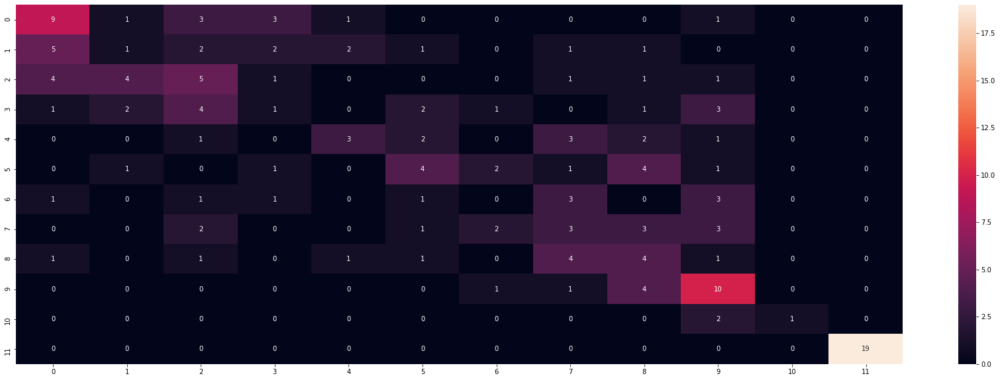

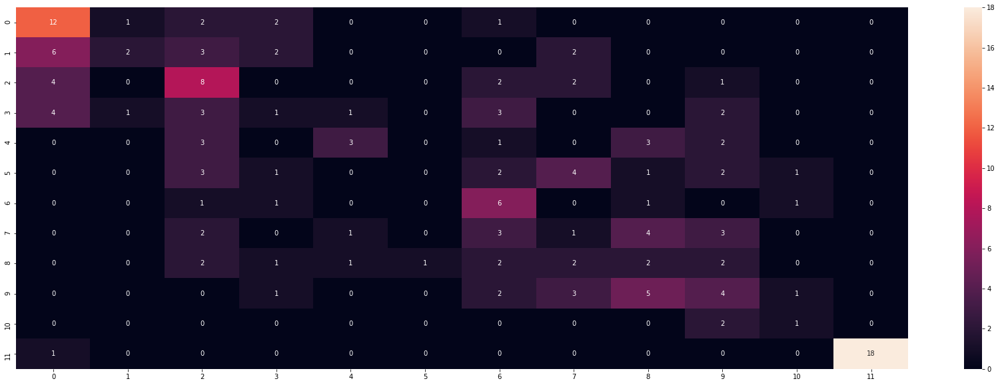

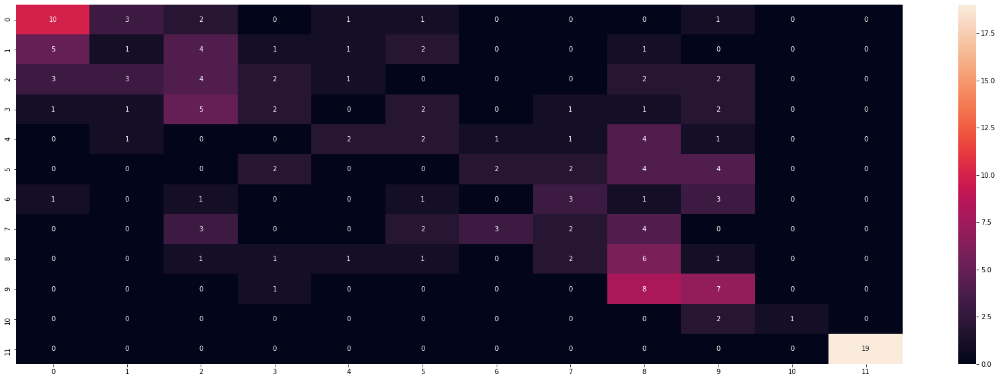

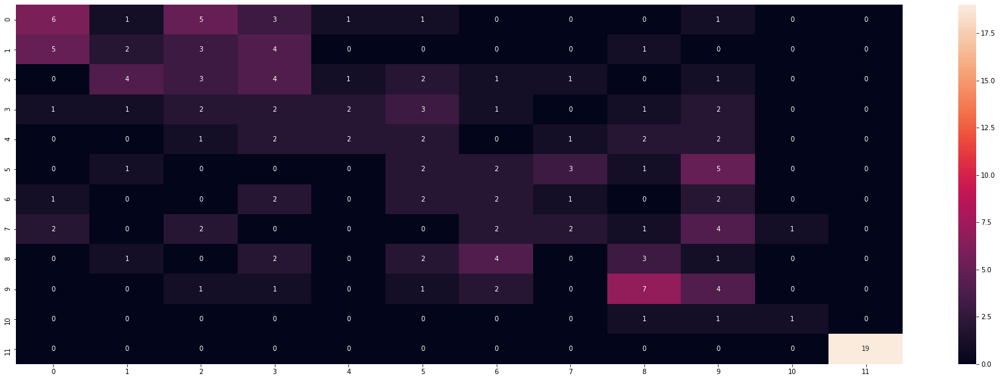

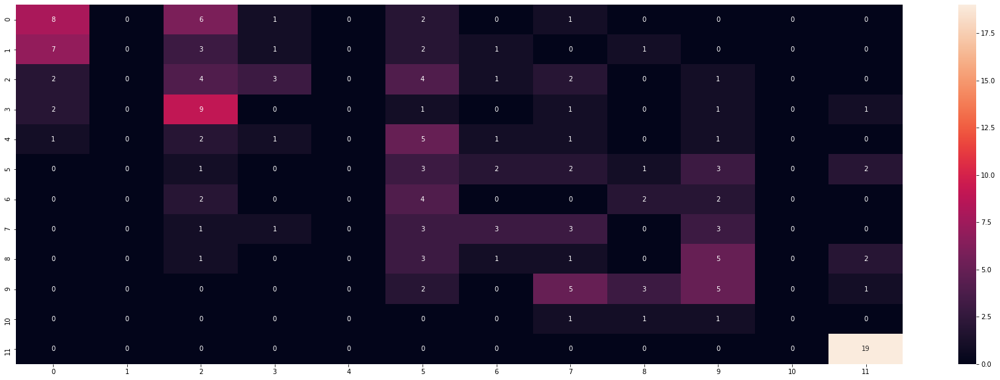

In [ ]:
e1,f1,g1,h1=call_classify(scaled_X,y) 

In [ ]:
result_16_28 = pd.DataFrame(
    {'Classifier': classif,
     'Accuracy': e1,
     'Precision': f1,
     'Recall': g1,
     'F1-score': h1,
    })

result_16_28

,Classifier,Accuracy,Precision,Recall,F1-score
0,Random Forest,39.277108,36.925016,39.568588,37.587499
1,Logistic_regression,34.457831,31.385229,32.141195,32.030467
2,SVM,35.542169,32.603578,34.287567,33.651527
3,Extratrees classifier,40.120482,36.385293,38.425899,36.774567
4,GaussianNB,34.698795,30.093935,30.978359,33.921134
5,XGBoost,37.831325,35.393120,37.636821,35.497528
6,Decision Tree,29.277108,27.304159,27.682000,28.245291
7,MLPClassifier,30.843373,21.850146,21.865579,25.153611


## Classifier on Lexical complexity analyzer features

In [ ]:
classification_file_2.columns

Index(['wordtypes', 'swordtypes', 'lextypes', 'slextypes', 'wordtokens',
       'swordtokens', 'lextokens', 'slextokens', 'ld', 'ls1', 'ls2', 'vs1',
       'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr',
       'cttr', 'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2',
       'nv', 'adjv', 'advv', 'modv', 'Level0', 'Level1', 'Level2', 'Level3',
       'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel', 'Level_en'],
      dtype='object')

In [ ]:
classification_file_2 = classification_file_2

In [ ]:
classification_file_3 = classification_file_2[[ 
                                             'wordtypes', 'swordtypes','lextypes', 'slextypes', 'wordtokens', 'swordtokens', 'lextokens','slextokens', 'ld', 'ls1', 'ls2', 
                                             'vs1', 'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr', 'cttr', 
                                             'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2', 'nv', 'adjv' , 'advv', 'modv']]
classification_file_3 = classification_file_3.reset_index(drop=True)

In [ ]:
classification_file_4 =  classification_file_2.drop(['Level0', 'Level1', 'Level2', 'Level3',
       'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel', 'Level_en'],axis=1)
classification_file_4 = classification_file_4.reset_index(drop=True)
classification_file_4

,wordtypes,swordtypes,lextypes,slextypes,wordtokens,swordtokens,lextokens,slextokens,ld,ls1,ls2,vs1,vs2,cvs1,ndw,ndwz,ndwerz,ndwesz,ttr,msttr,cttr,rttr,logttr,uber,lv,vv1,svv1,cvv1,vv2,nv,adjv,advv,modv
0,33,8,20,8,64,17,39,17,0.61,0.44,0.24,0.07,0.07,0.19,33,22,27.6,27.1,0.52,0.44,2.92,4.12,0.84,11.34,0.51,0.36,1.79,0.94,0.13,0.60,0.00,0.00,0.00
1,11,6,9,6,32,6,16,6,0.50,0.38,0.55,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,0.56,0.00,0.00,0.00,0.00,0.12,0.50,0.00,0.50
2,30,4,19,4,57,13,28,13,0.49,0.46,0.13,0.00,0.00,0.00,30,24,26.4,26.4,0.53,0.48,2.81,3.97,0.84,11.06,0.68,1.00,4.00,1.41,0.14,0.47,0.21,0.04,0.25
3,34,7,22,7,51,14,29,14,0.57,0.48,0.21,0.18,0.36,0.43,34,33,33.3,33.4,0.67,0.66,3.37,4.76,0.90,16.56,0.76,1.00,11.00,2.35,0.38,0.56,0.07,0.00,0.07
4,11,7,8,7,32,7,8,7,0.25,0.88,0.64,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2081,32,3,21,3,43,4,22,4,0.51,0.18,0.09,0.33,0.67,0.58,32,32,32.0,32.0,0.74,0.74,3.45,4.88,0.92,20.79,0.95,1.00,6.00,1.73,0.27,1.00,0.09,0.00,0.09
2082,34,6,20,6,60,7,34,7,0.57,0.21,0.18,0.00,0.00,0.00,34,30,29.6,31.0,0.57,0.60,3.10,4.39,0.86,12.82,0.59,0.75,4.50,1.50,0.18,0.85,0.09,0.00,0.09
2083,10,7,9,7,17,7,9,7,0.53,0.78,0.70,0.00,0.00,0.00,10,10,10.0,10.0,0.59,0.59,1.71,2.43,0.81,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
2084,31,8,21,8,51,17,32,17,0.63,0.53,0.26,0.00,0.00,0.00,31,31,30.4,31.0,0.61,0.62,3.07,4.34,0.87,13.49,0.66,1.00,5.00,1.58,0.16,0.82,0.06,0.00,0.06


In [ ]:
classification_file_4.columns

Index(['wordtypes', 'swordtypes', 'lextypes', 'slextypes', 'wordtokens',
       'swordtokens', 'lextokens', 'slextokens', 'ld', 'ls1', 'ls2', 'vs1',
       'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr',
       'cttr', 'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2',
       'nv', 'adjv', 'advv', 'modv'],
      dtype='object')

In [ ]:
X.columns

Index(['wordtypes', 'swordtypes', 'lextypes', 'slextypes', 'wordtokens',
       'swordtokens', 'lextokens', 'slextokens', 'ld', 'ls1', 'ls2', 'vs1',
       'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr',
       'cttr', 'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2',
       'nv', 'adjv', 'advv', 'modv', 'Level0', 'Level1', 'Level2', 'Level3',
       'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel'],
      dtype='object')

In [ ]:

# y =  classification_file_2.Level_en.astype(int)
y =  classification_file_2.Level_en
X =  classification_file_2.drop('Level_en',axis=1)
scaler=StandardScaler()
scaled_X = scaler.fit_transform(X)
classification_file_3

,wordtypes,swordtypes,lextypes,slextypes,wordtokens,swordtokens,lextokens,slextokens,ld,ls1,ls2,vs1,vs2,cvs1,ndw,ndwz,ndwerz,ndwesz,ttr,msttr,cttr,rttr,logttr,uber,lv,vv1,svv1,cvv1,vv2,nv,adjv,advv,modv
0,33,8,20,8,64,17,39,17,0.61,0.44,0.24,0.07,0.07,0.19,33,22,27.6,27.1,0.52,0.44,2.92,4.12,0.84,11.34,0.51,0.36,1.79,0.94,0.13,0.60,0.00,0.00,0.00
1,11,6,9,6,32,6,16,6,0.50,0.38,0.55,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,0.56,0.00,0.00,0.00,0.00,0.12,0.50,0.00,0.50
2,30,4,19,4,57,13,28,13,0.49,0.46,0.13,0.00,0.00,0.00,30,24,26.4,26.4,0.53,0.48,2.81,3.97,0.84,11.06,0.68,1.00,4.00,1.41,0.14,0.47,0.21,0.04,0.25
3,34,7,22,7,51,14,29,14,0.57,0.48,0.21,0.18,0.36,0.43,34,33,33.3,33.4,0.67,0.66,3.37,4.76,0.90,16.56,0.76,1.00,11.00,2.35,0.38,0.56,0.07,0.00,0.07
4,11,7,8,7,32,7,8,7,0.25,0.88,0.64,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2081,32,3,21,3,43,4,22,4,0.51,0.18,0.09,0.33,0.67,0.58,32,32,32.0,32.0,0.74,0.74,3.45,4.88,0.92,20.79,0.95,1.00,6.00,1.73,0.27,1.00,0.09,0.00,0.09
2082,34,6,20,6,60,7,34,7,0.57,0.21,0.18,0.00,0.00,0.00,34,30,29.6,31.0,0.57,0.60,3.10,4.39,0.86,12.82,0.59,0.75,4.50,1.50,0.18,0.85,0.09,0.00,0.09
2083,10,7,9,7,17,7,9,7,0.53,0.78,0.70,0.00,0.00,0.00,10,10,10.0,10.0,0.59,0.59,1.71,2.43,0.81,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00
2084,31,8,21,8,51,17,32,17,0.63,0.53,0.26,0.00,0.00,0.00,31,31,30.4,31.0,0.61,0.62,3.07,4.34,0.87,13.49,0.66,1.00,5.00,1.58,0.16,0.82,0.06,0.00,0.06


In [ ]:
classification_file_3 = classification_file[['Level',  
                                             'wordtypes', 'swordtypes','lextypes', 'slextypes', 'wordtokens', 'swordtokens', 'lextokens','slextokens', 'ld', 'ls1', 'ls2', 
                                             'vs1', 'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr', 'cttr', 
                                             'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2', 'nv', 'adjv' , 'advv', 'modv']]
classification_file_3 = classification_file_3.dropna(subset= ['Level',  
                                             'wordtypes', 'swordtypes','lextypes', 'slextypes', 'wordtokens', 'swordtokens', 'lextokens','slextokens', 'ld', 'ls1', 'ls2', 
                                             'vs1', 'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr', 'cttr', 
                                             'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2', 'nv', 'adjv' , 'advv', 'modv'])
classification_file_3 = classification_file_3.reset_index(drop=True)

index_names = classification_file_3[ classification_file_3['Level'] == 'aa' ].index   #Only 1 sample of F
classification_file_3.drop(index_names, inplace = True)
classification_file_3 = classification_file_3.reset_index(drop=True)

index_names = classification_file_3[ classification_file_3['Level'] == 'F' ].index  #Dropped because of less amount of samples
classification_file_3.drop(index_names, inplace = True)
classification_file_3 = classification_file_3.reset_index(drop=True)


classification_file_3["Level"] = classification_file_3["Level"].astype(str)
le = preprocessing.LabelEncoder()
le.fit(classification_file_3['Level'])
classification_file_3["Level_en"] = pd.Series(le.transform(classification_file_3['Level']))   # label encoded
classification_file_3 = classification_file_3.dropna(subset= ["Level_en"])
classification_file_3 = classification_file_3[~classification_file_3.isin(['NaN']).any(axis =1)]
classification_file_3.drop("Level", axis=1, inplace =True)
classification_file_3.head()
classification_file_3.columns

Index(['wordtypes', 'swordtypes', 'lextypes', 'slextypes', 'wordtokens',
       'swordtokens', 'lextokens', 'slextokens', 'ld', 'ls1', 'ls2', 'vs1',
       'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr',
       'cttr', 'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2',
       'nv', 'adjv', 'advv', 'modv', 'Level_en'],
      dtype='object')

In [ ]:
y =  classification_file_3.Level_en
X =  classification_file_3.drop('Level_en',axis=1)
scaler=StandardScaler()
scaled_X = scaler.fit_transform(X)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=-1, oob_score=False, random_state=100, verbose=0,
                       warm_start=False) :
Average of all Precision : 0.324150693905667
Average of all Accuracy : 0.34530161522245956
Average of all Recall : 0.31673641941742925
Average of all F1-score : 0.3110659943637006
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=100, solver='lbfgs', tol=0.000

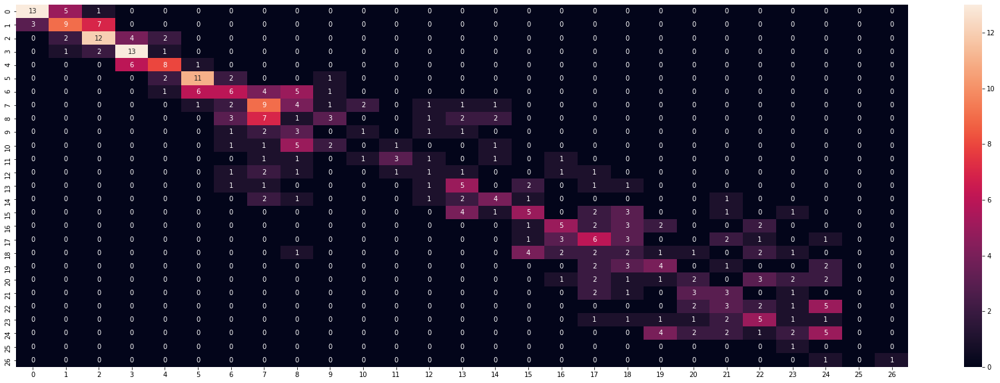

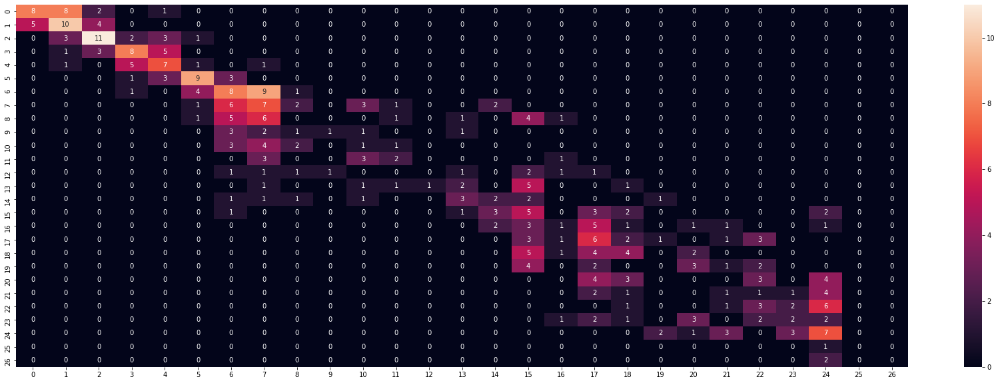

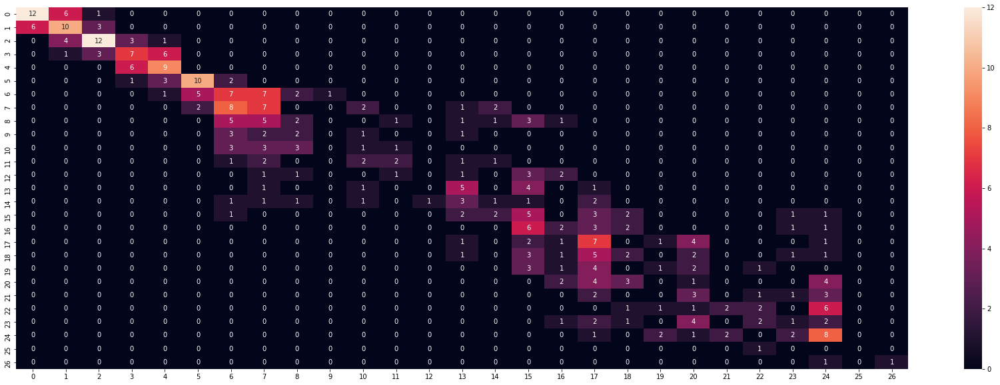

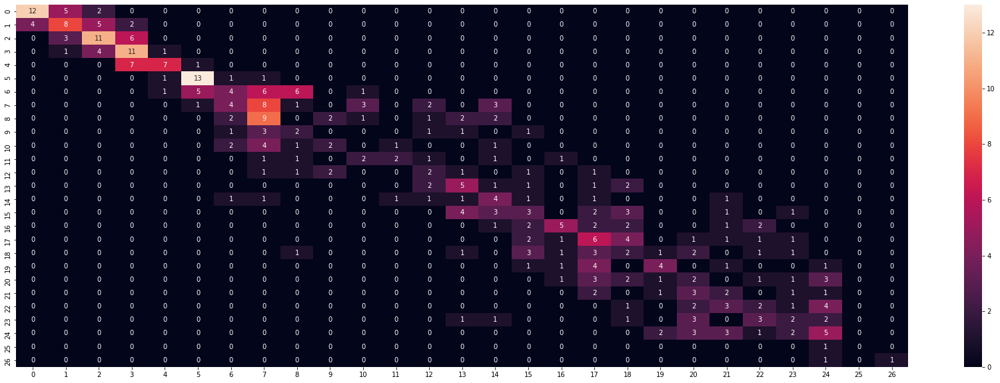

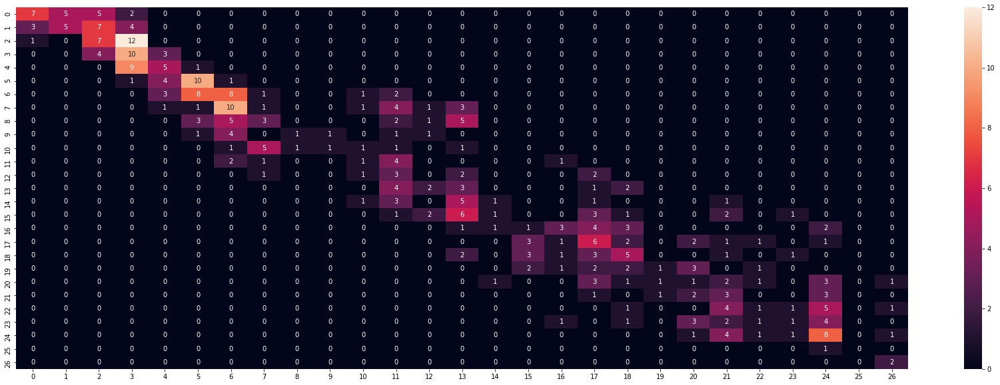

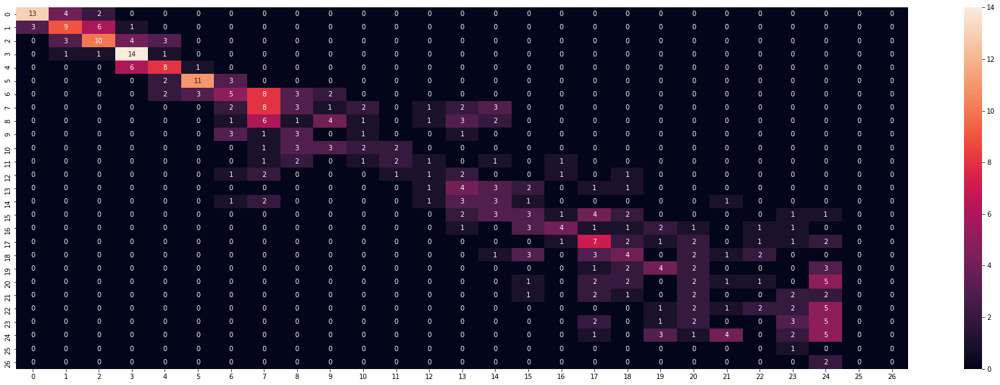

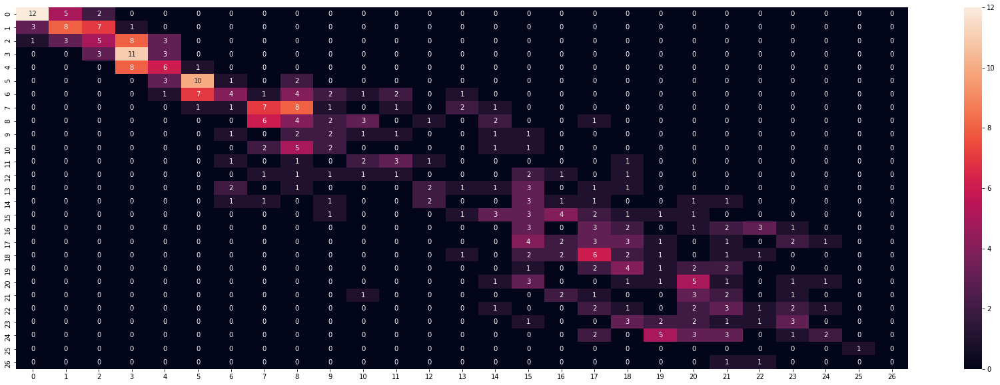

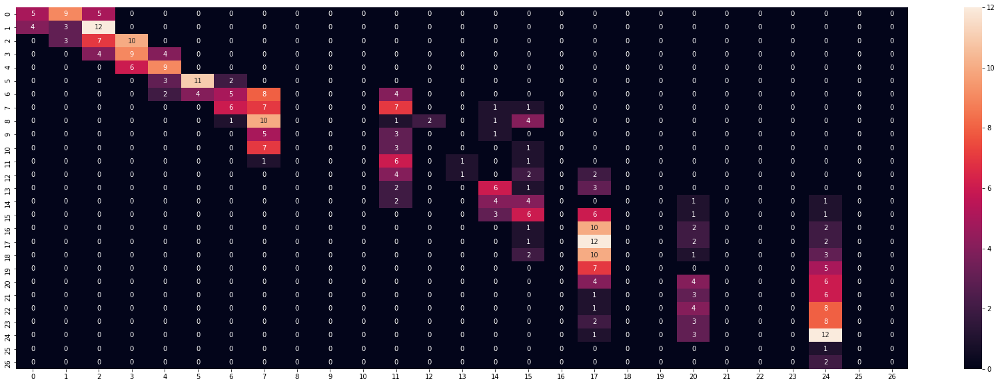

In [ ]:
e1,f1,g1,h1=call_classify(scaled_X,y) 


In [ ]:
result1 = pd.DataFrame(
    {'Classifier': classif,
     'Accuracy': e1,
     'Precision': f1,
     'Recall': g1,
     'F1-score': h1,
    })

result1

,Classifier,Accuracy,Precision,Recall,F1-score
0,Random Forest,34.530162,31.106599,32.415069,31.673642
1,Logistic_regression,27.560833,22.371520,23.641508,23.395786
2,SVM,30.570144,25.823738,27.122401,26.545565
3,Extratrees classifier,34.528765,31.803858,33.374646,32.422607
4,GaussianNB,24.076447,20.297150,20.912209,24.255774
5,XGBoost,33.368374,29.636062,30.368515,30.565866
6,Decision Tree,26.082004,23.732723,24.593646,24.068019
7,MLPClassifier,28.721084,19.753263,19.458829,24.283436


In [ ]:
result

,Classifier,Accuracy,Precision,Recall,F1-score
0,Random Forest,36.289743,32.581034,34.175737,33.284762
1,Logistic_regression,30.823035,26.063524,27.051689,26.732274
2,SVM,32.789577,27.295612,28.326636,27.811106
3,Extratrees classifier,36.240520,32.754278,33.890766,33.378390
4,GaussianNB,23.970030,20.599212,22.296416,23.626102
5,XGBoost,34.995238,31.401466,32.507128,31.950824
6,Decision Tree,29.433754,26.361002,26.983373,26.521035
7,MLPClassifier,29.579246,21.738819,21.819631,25.022979


## Classifier on D-level analyzer feature

In [ ]:
classification_file_4 = classification_file[['Level',  
                                             'Level0', 'Level1', 'Level2','Level3', 'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel']]
classification_file_4 = classification_file_4.dropna(subset= ['Level',  
                                             'Level0', 'Level1', 'Level2','Level3', 'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel'])
classification_file_4 = classification_file_4.reset_index(drop=True)

index_names = classification_file_4[ classification_file_4['Level'] == 'aa' ].index   #Only 1 sample of F
classification_file_4.drop(index_names, inplace = True)
classification_file_4 = classification_file_4.reset_index(drop=True)

index_names = classification_file_4[ classification_file_4['Level'] == 'F' ].index  #Dropped because of less amount of samples
classification_file_4.drop(index_names, inplace = True)
classification_file_4 = classification_file_4.reset_index(drop=True)


classification_file_4["Level"] = classification_file_4["Level"].astype(str)
le = preprocessing.LabelEncoder()
le.fit(classification_file_4['Level'])
classification_file_4["Level_en"] = pd.Series(le.transform(classification_file_4['Level']))   # label encoded
classification_file_4 = classification_file_4.dropna(subset= ["Level_en"])
classification_file_4 = classification_file_4[~classification_file_4.isin(['NaN']).any(axis =1)]
classification_file_4.drop("Level", axis=1, inplace =True)
classification_file_4.head()
classification_file_4.columns

Index(['Level0', 'Level1', 'Level2', 'Level3', 'Level4', 'Level5', 'Level6',
       'Level7', 'MeanLevel', 'Level_en'],
      dtype='object')

In [ ]:
y1 =  classification_file_4.Level_en
X1 =  classification_file_4.drop('Level_en',axis=1)
scaler=StandardScaler()
scaled_X1 = scaler.fit_transform(X1)

In [ ]:
def classify(X,y,classifier): 
    kf = StratifiedKFold(n_splits=5,shuffle=True,random_state=100)
    acc_score=[]
    prec_score =[]
    f_score =[]
    reca_score =[]
    i=1
    for train_index,test_index in kf.split(X,y):
        #print('{} of KFold {}'.format(i,kf.n_splits))
        # print(train_index)
        # xtr,xvl = np.take(X, train_index), np.take(X, test_index)  #X[train_index],X[test_index]
        # ytr,yvl = np.take(y, train_index), np.take(y, test_index)  # y[train_index],y[test_index]
        xtr,xvl = X[train_index],X[test_index]
        ytr,yvl = y[train_index],y[test_index]
        # print(f"Unique training: {np.unique(ytr)}")
        # print(f"Unique validation {np.unique(yvl)}")
        #model
        clfr = classifier
        clfr.fit(xtr,ytr)
        pred2= clfr.predict(xvl) 
        Accuracy= accuracy_score(yvl, pred2)
        #confusion matrix',confusion_matrix(yvl, pred))
        recall = metrics.recall_score(yvl, pred2,average= 'macro')
        precision = metrics.precision_score(yvl, pred2,average= 'macro')
        fscore=metrics.f1_score(yvl, pred2,average= 'macro')
        # print(metrics.confusion_matrix(yvl,pred2))
        
        #print('confusion matrix',confusion_matrix(yvl, pred2))
        #print('precision_recall_fscore_support',precision_recall_fscore_support(yvl, pred2))
        acc_score.append(Accuracy)
        prec_score.append(precision)
        reca_score.append(recall)
        f_score.append(fscore)
        i+=1
    e = (sum(acc_score)/len(acc_score))
    f= (sum(prec_score)/len(prec_score))
    g=(sum(reca_score)/len(reca_score))
    h=(sum(f_score)/len(f_score))
    print(classifier,':')
    print('\033[1m'+'Average of all Precision :' +'\033[0m',f)
    print('\033[1m'+'Average of all Accuracy :' +'\033[0m',e)
    print('\033[1m'+'Average of all Recall :' +'\033[0m',g)
    print('\033[1m'+'Average of all F1-score :' +'\033[0m',h)
    return e,f,g,h
    

In [ ]:
def call_classify(X1,y1):   
    accuracy=[]
    avg_precision=[]
    recall=[]
    f_score=[]
    classifiers = [RandomForestClassifier(n_estimators=200,n_jobs=-1,random_state=100),
                   LogisticRegression(random_state=100),SVC(kernel='linear',random_state=100,probability=True),
                   ExtraTreesClassifier(n_estimators=100, random_state=100),GaussianNB(),
                   xgb.XGBClassifier(objective="binary:logistic", random_state=100), DecisionTreeClassifier(),MLPClassifier(solver='lbfgs', alpha=1e-5,
                    hidden_layer_sizes=(5, 2), random_state=1)]
    for classifier in (classifiers):
            e,f,g,h = classify(X1,y1,classifier)
            accuracy.append(e*100)
            avg_precision.append(f*100)
            recall.append(g*100)
            f_score.append(h*100)
    return accuracy,f_score,avg_precision,recall
classif = ['Random Forest','Logistic_regression','SVM','Extratrees classifier','GaussianNB','XGBoost','Decision Tree','MLPClassifier']        

e1,f1,g1,h1=call_classify(scaled_X1,y1) 


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=-1, oob_score=False, random_state=100, verbose=0,
                       warm_start=False) :
Average of all Precision : 0.2117424876331905
Average of all Accuracy : 0.2492119333807988
Average of all Recall : 0.2124930748424883
Average of all F1-score : 0.2049930626661971
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=100, solver='lbfgs', tol=0.0001

In [ ]:
result2 = pd.DataFrame(
    {'Classifier': classif,
     'Accuracy': e1,
     'Precision': f1,
     'Recall': g1,
     'F1-score': h1,
    })

result2

,Classifier,Accuracy,Precision,Recall,F1-score
0,Random Forest,24.921193,20.499306,21.174249,21.249307
1,Logistic_regression,21.119348,16.335506,17.144498,17.667048
2,SVM,22.914520,17.520348,19.279624,19.423595
3,Extratrees classifier,23.759825,19.577813,20.026624,20.378893
4,GaussianNB,16.314445,11.930957,12.651858,14.339060
5,XGBoost,21.752454,17.821119,19.167966,18.470518
6,Decision Tree,18.743282,15.426953,15.947328,15.829903
7,MLPClassifier,21.012132,11.988110,10.848507,16.340973


In [ ]:
result1

,Classifier,Accuracy,Precision,Recall,F1-score
0,Random Forest,34.530162,31.106599,32.415069,31.673642
1,Logistic_regression,27.560833,22.371520,23.641508,23.395786
2,SVM,30.570144,25.823738,27.122401,26.545565
3,Extratrees classifier,34.528765,31.803858,33.374646,32.422607
4,GaussianNB,24.076447,20.297150,20.912209,24.255774
5,XGBoost,33.368374,29.636062,30.368515,30.565866
6,Decision Tree,26.346135,24.269949,25.310251,24.492786
7,MLPClassifier,16.625902,9.236931,10.757566,13.344000


In [ ]:
result

,Classifier,Accuracy,Precision,Recall,F1-score
0,Random Forest,36.289743,32.581034,34.175737,33.284762
1,Logistic_regression,30.823035,26.063524,27.051689,26.732274
2,SVM,32.789577,27.295612,28.326636,27.811106
3,Extratrees classifier,36.240520,32.754278,33.890766,33.378390
4,GaussianNB,23.970030,20.599212,22.296416,23.626102
5,XGBoost,34.995238,31.401466,32.507128,31.950824
6,Decision Tree,29.433754,26.361002,26.983373,26.521035
7,MLPClassifier,29.579246,21.738819,21.819631,25.022979


# Feature Importance

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=1) # 90% training and 10% test

In [ ]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier()

# Train Decision Tree Classifer
clf = clf.fit(X_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [ ]:
feature_cols = ['wordtypes', 'swordtypes','lextypes', 'slextypes', 'wordtokens', 'swordtokens', 'lextokens','slextokens', 'ld', 'ls1', 'ls2', 
                                             'vs1', 'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr', 'cttr', 
                                             'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2', 'nv', 'adjv' , 'advv', 'modv', 
                                              'Level0', 'Level1', 'Level2','Level3', 'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel']

In [ ]:
X_train.head()

,wordtypes,swordtypes,lextypes,slextypes,wordtokens,swordtokens,lextokens,slextokens,ld,ls1,ls2,vs1,vs2,cvs1,ndw,ndwz,ndwerz,ndwesz,ttr,msttr,cttr,rttr,logttr,uber,lv,vv1,svv1,cvv1,vv2,nv,adjv,advv,modv,Level0,Level1,Level2,Level3,Level4,Level5,Level6,Level7,MeanLevel
1037,264,67,195,64,722,150,387,138,0.54,0.36,0.25,0.05,0.19,0.31,264,39,38.7,40.4,0.37,0.76,6.95,9.83,0.85,18.70,0.50,0.64,34.71,4.17,0.14,0.43,0.10,0.03,0.13,30,1,4,2,2,4,1,7,45.33
1595,521,156,415,145,1817,365,905,294,0.50,0.32,0.30,0.13,4.92,1.57,521,41,40.1,38.7,0.29,0.77,8.64,12.22,0.83,19.58,0.46,0.49,74.77,6.11,0.17,0.43,0.07,0.03,0.10,68,7,6,9,12,9,0,22,85.03
813,196,37,137,33,517,103,247,80,0.48,0.32,0.19,0.06,0.30,0.39,196,43,38.8,36.7,0.38,0.72,6.10,8.62,0.84,17.48,0.55,0.68,38.68,4.40,0.23,0.45,0.08,0.04,0.12,28,0,5,7,2,8,0,3,62.00
1086,319,67,239,63,1031,182,537,168,0.52,0.31,0.21,0.06,0.54,0.52,319,35,38.9,37.5,0.31,0.73,7.03,9.93,0.83,17.82,0.45,0.48,35.29,4.20,0.14,0.41,0.09,0.02,0.11,27,1,3,10,5,5,3,18,85.94
577,76,12,55,12,189,12,94,12,0.50,0.13,0.16,0.03,0.03,0.12,76,28,32.3,32.5,0.40,0.62,3.91,5.53,0.83,13.10,0.59,0.48,7.76,1.97,0.17,0.63,0.09,0.03,0.12,9,4,6,0,0,5,0,2,39.33


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.318398 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.318398 to fit



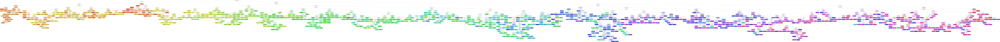

In [ ]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus

dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('text.png')
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.318398 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.318398 to fit



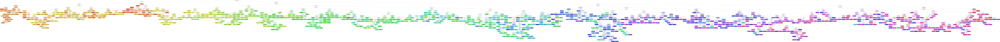

In [ ]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_cols)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('text.png')
Image(graph.create_png())


In [ ]:
graph.write_pdf("text.pdf")

True

## Feature Importance

Automatically created module for IPython interactive environment
Feature ranking:
1. feature 4 (0.043095)
2. feature 14 (0.037223)
3. feature 6 (0.037151)
4. feature 0 (0.036123)
5. feature 2 (0.031767)
6. feature 19 (0.028727)
7. feature 18 (0.027517)
8. feature 21 (0.026900)
9. feature 7 (0.026897)
10. feature 17 (0.026384)
11. feature 15 (0.026376)
12. feature 5 (0.026342)
13. feature 1 (0.025516)
14. feature 16 (0.025112)
15. feature 20 (0.025054)
16. feature 24 (0.024915)
17. feature 3 (0.024584)
18. feature 33 (0.023569)
19. feature 27 (0.023135)
20. feature 29 (0.023103)
21. feature 23 (0.023086)
22. feature 26 (0.022650)
23. feature 41 (0.022420)
24. feature 25 (0.022375)
25. feature 8 (0.021859)
26. feature 22 (0.021842)
27. feature 40 (0.020854)
28. feature 9 (0.020366)
29. feature 28 (0.020156)
30. feature 10 (0.020130)
31. feature 32 (0.019940)
32. feature 30 (0.019455)
33. feature 36 (0.019081)
34. feature 35 (0.018968)
35. feature 37 (0.018693)
36. feature 13 (0.018681)
3

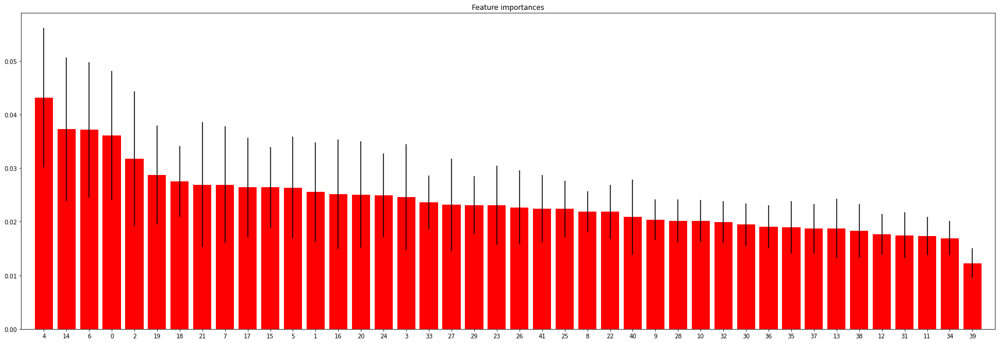

In [ ]:
print(__doc__)

import numpy as np
import matplotlib.pyplot as plt

from sklearn.datasets import make_classification
from sklearn.ensemble import ExtraTreesClassifier

# Build a forest and compute the impurity-based feature importances
forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=0)

forest.fit(X, y)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the impurity-based feature importances of the forest
plt.figure(figsize = (30,10))
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
        color="r", yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), indices)
plt.xlim([-1, X.shape[1]])
plt.show()

In [ ]:
best_fea_list = indices.tolist()
best_fea_list_2 = best_fea_list[0:3]
print(best_fea_list_2)
columnsNamesArr = X.columns.values
print(columnsNamesArr[best_fea_list_2])


y =  classification_file_2.Level_en
# X =  classification_file_2.drop('Level_en',axis=1)

X_2 = X.iloc[:,best_fea_list_2 ]

scaler=StandardScaler()
scaled_X = scaler.fit_transform(X_2)

[4, 14, 6]
['wordtokens' 'ndw' 'lextokens']


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=-1, oob_score=False, random_state=100, verbose=0,
                       warm_start=False) :
Average of all Precision : 0.2764322321677591
Average of all Accuracy : 0.3092056498341996
Average of all Recall : 0.2752652273431102
Average of all F1-score : 0.2707272656779783
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=100, solver='lbfgs', tol=0.0001

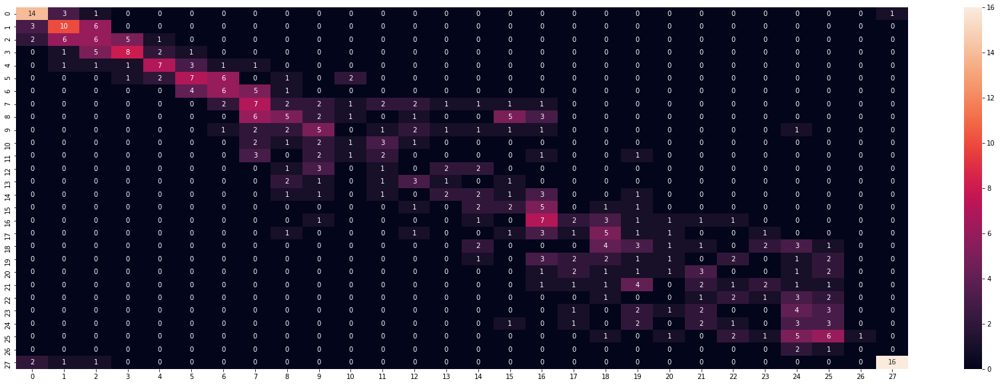

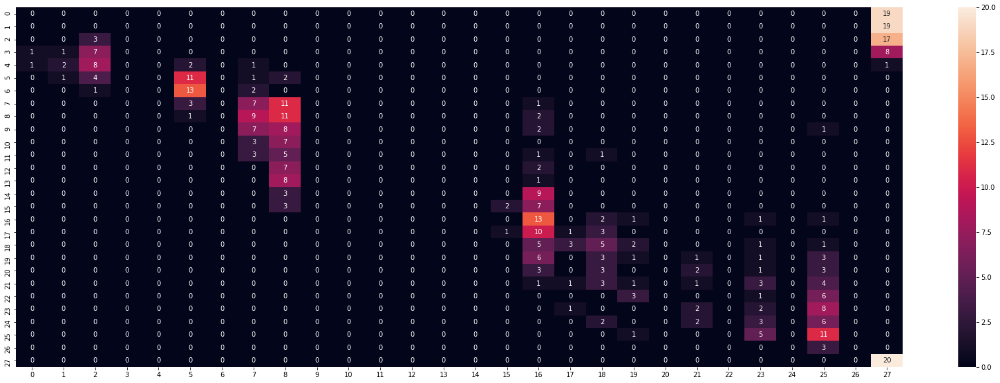

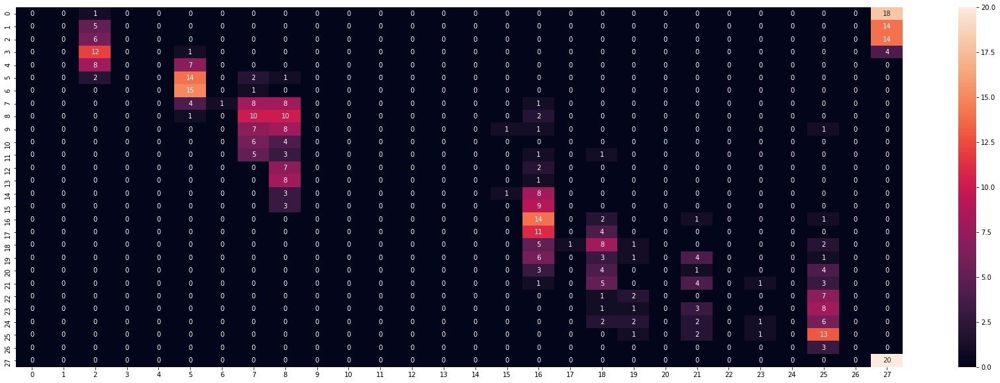

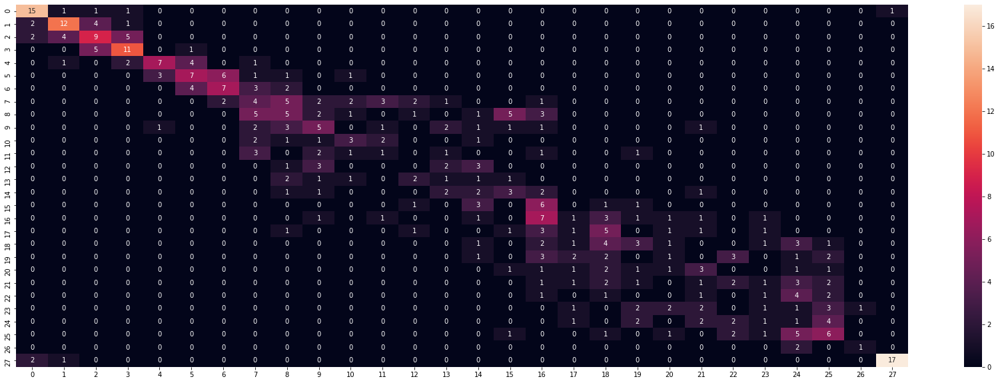

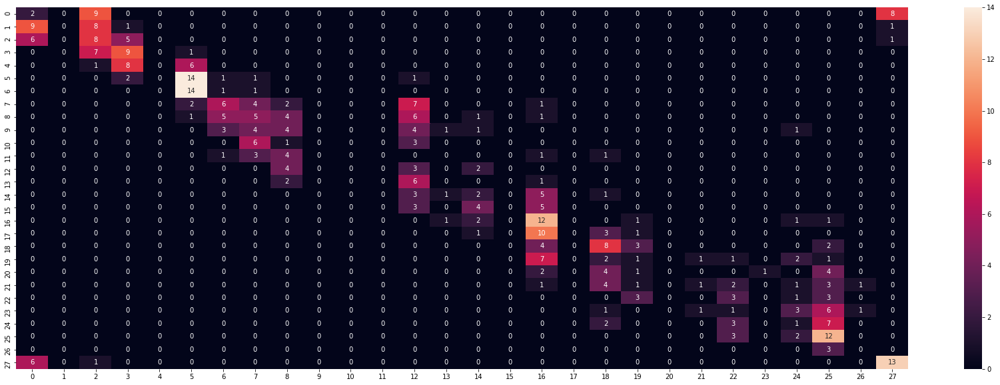

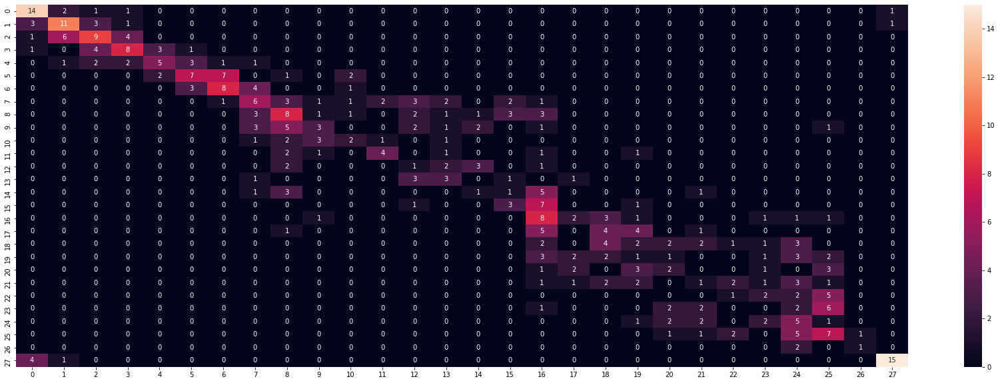

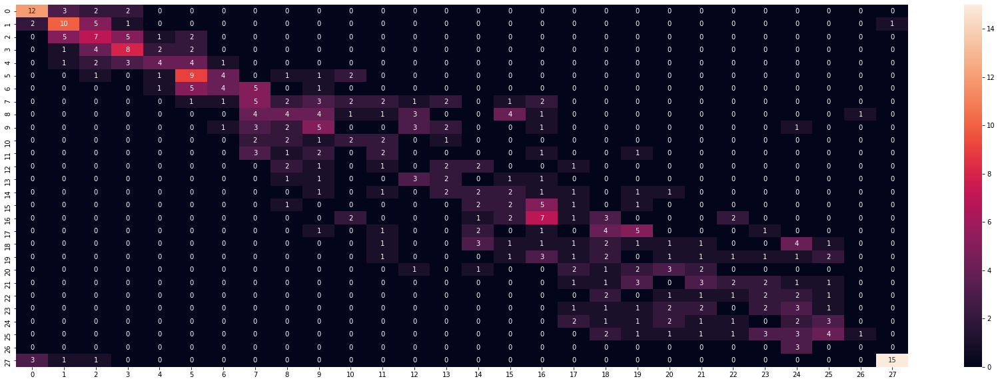

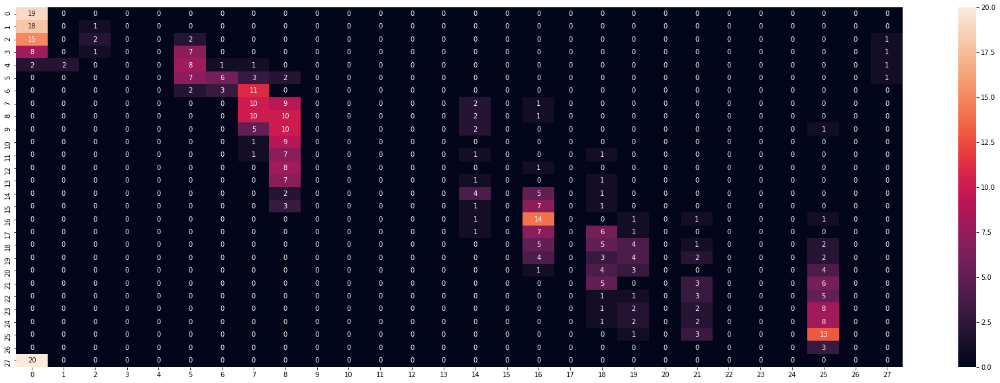

In [ ]:
e1,f1,g1,h1=call_classify(scaled_X,y) 

In [ ]:
result_best_feature = pd.DataFrame(
    {'Classifier': classif,
     'Accuracy': e1,
     'Precision': f1,
     'Recall': g1,
     'F1-score': h1,
    })

result_best_feature

,Classifier,Accuracy,Precision,Recall,F1-score
0,Random Forest,30.920565,27.072727,27.643223,27.526523
1,Logistic_regression,19.607242,9.095944,7.850962,15.320071
2,SVM,21.908253,10.286467,8.501383,17.277936
3,Extratrees classifier,30.728374,27.317285,28.017514,27.602197
4,GaussianNB,20.519202,14.555785,12.728986,19.621851
5,XGBoost,32.022191,27.784838,28.568111,28.463059
6,Decision Tree,27.324016,23.863312,24.191002,24.199536
7,MLPClassifier,22.866568,12.263864,10.930779,18.434652


In [ ]:
scaled_X.shape

(2086, 3)

## Recursive feature elimination

In [ ]:
# feature extraction
model = LogisticRegression(solver='lbfgs')
rfe = RFE(model, 5)
fit = rfe.fit(scaled_X, y)
print("Num Features: %d" % fit.n_features_)
print("Selected Features: %s" % fit.support_)
print("Feature Ranking: %s" % fit.ranking_)

Num Features: 5
Selected Features: [False False False False  True False False False False False False False
 False False  True False  True False  True  True False False False False
 False False False False False False False False False False False False
 False False False False False False]
Feature Ranking: [ 6 33  5 27  1  8  2 21 17 32 18 28 20 19  1  9  1  7  1  1 14 24 13  4
 25 23  3 22 31 16 30 34 29 12 36 26 15 37 35 38 11 10]


In [ ]:
best_fea_list = (fit.ranking_).tolist()
best_fea_list_2 = [i for i, e in enumerate(fit_2) if e == 1]
print(best_fea_list_2)
columnsNamesArr = X.columns.values
print(columnsNamesArr[best_fea_list_2])


y =  classification_file_2.Level_en
# X =  classification_file_2.drop('Level_en',axis=1)

X_2 = X.iloc[:,best_fea_list_2 ]

scaler=StandardScaler()
scaled_X = scaler.fit_transform(X_2)

[4, 14, 16, 18, 19]
['wordtokens' 'ndw' 'ndwerz' 'ttr' 'msttr']


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=-1, oob_score=False, random_state=100, verbose=0,
                       warm_start=False) :
Average of all Precision : 0.300620732641635
Average of all Accuracy : 0.32790724358312395
Average of all Recall : 0.29976227714528747
Average of all F1-score : 0.2950008769210763
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=100, solver='lbfgs', tol=0.000

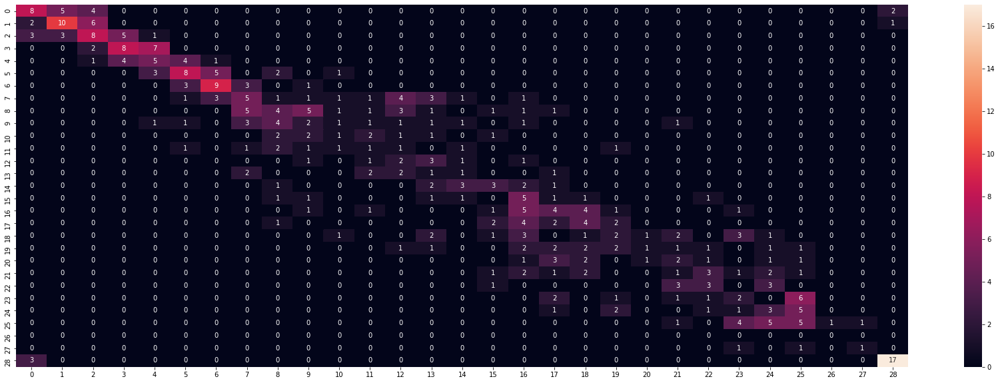

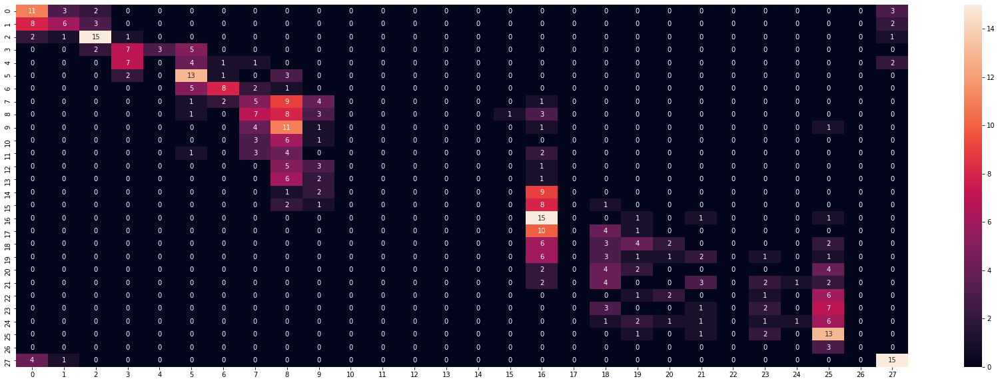

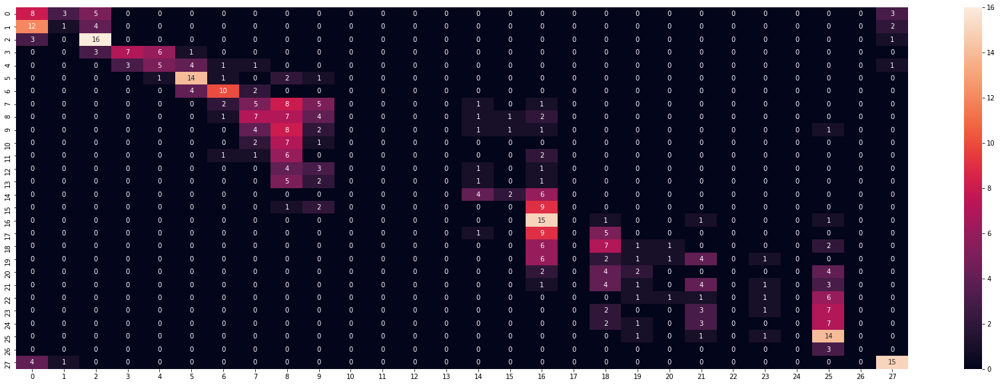

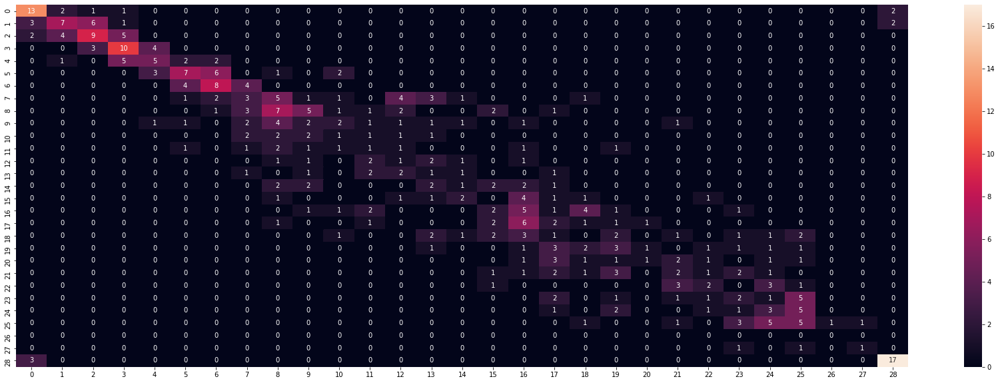

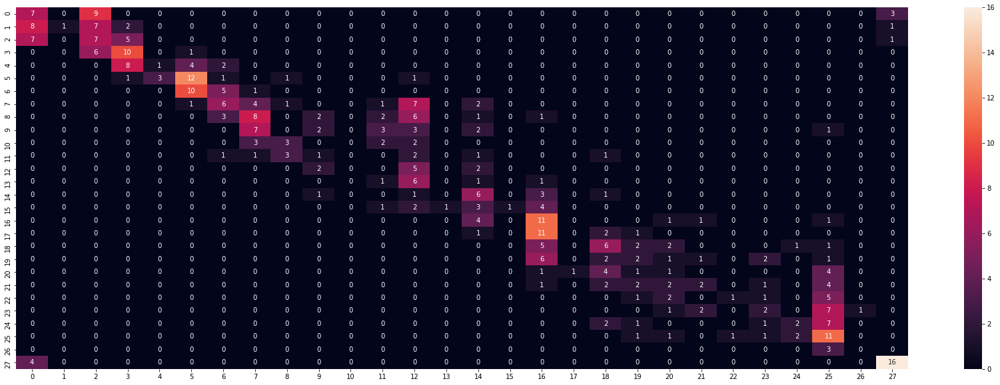

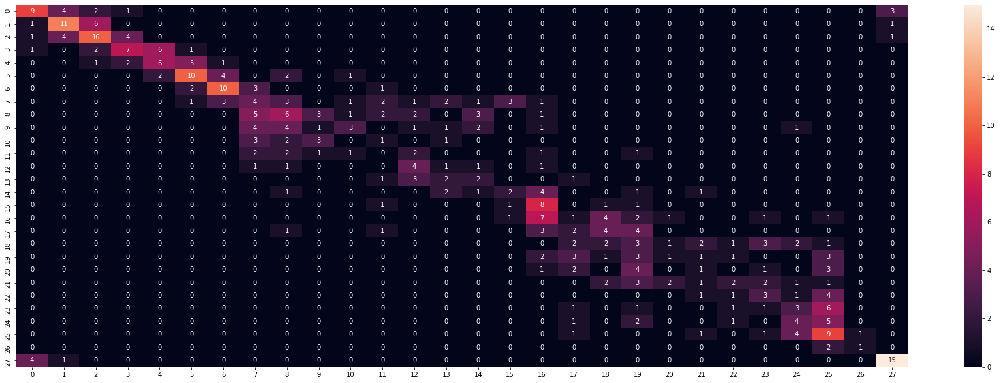

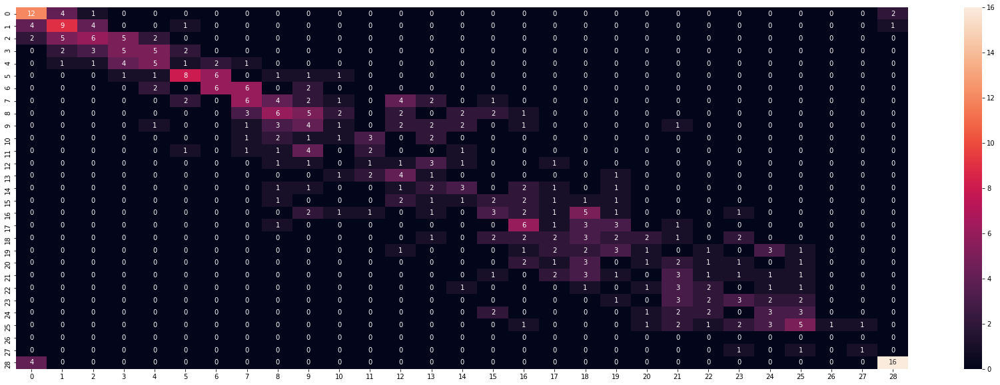

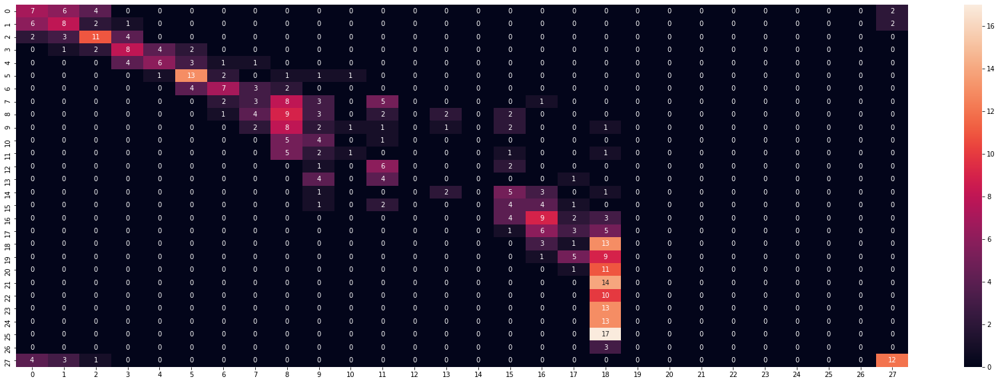

In [ ]:
e1,f1,g1,h1=call_classify(scaled_X,y) 

In [ ]:
result_best_feature = pd.DataFrame(
    {'Classifier': classif,
     'Accuracy': e1,
     'Precision': f1,
     'Recall': g1,
     'F1-score': h1,
    })

result_best_feature

,Classifier,Accuracy,Precision,Recall,F1-score
0,Random Forest,32.790724,29.500088,30.062073,29.976228
1,Logistic_regression,28.907324,19.986827,20.579338,23.192154
2,SVM,30.298555,21.201507,21.795468,24.713538
3,Extratrees classifier,30.488910,27.460342,28.042715,27.816948
4,GaussianNB,25.406813,20.258161,22.496118,23.793106
5,XGBoost,31.926727,28.585252,29.225611,29.299260
6,Decision Tree,29.001526,25.015002,25.538447,25.197837
7,MLPClassifier,29.721868,20.804569,21.027688,24.407095


## Principal Component Analysis

In [ ]:
# feature extraction
pca = PCA(n_components=10)
fit = pca.fit(X)
# summarize components
# print("Explained Variance: %s" % fit.explained_variance_ratio_)
# print(fit.components_)

## Univariate Selection

In [ ]:
# feature extraction
test = SelectKBest(score_func=f_classif, k=4)
fit = test.fit(scaled_X, y)
# summarize scores
set_printoptions(precision=3)
print(fit.scores_)
features = fit.transform(X)
# summarize selected features
# print(features[0:5,:])

[662.912 397.412 601.88  384.571 522.949 374.061 522.589 370.988   2.378
   3.846  24.455   9.708  57.751 130.326 662.912 187.327 220.923 190.717
  89.136 301.903 552.571 552.693  20.194 176.379  51.97    2.589 284.876
 433.736   4.645  42.791   3.521  14.848   7.336  75.248  19.513  89.641
  93.618  54.912  81.283  27.057 157.52  162.32 ]


In [ ]:
best_fea_list = (fit.scores_).tolist()
best_fea_list_2 = sorted(range(len(best_fea_list)), key = lambda sub: best_fea_list[sub])[-5:]
print(best_fea_list_2)
# best_fea_list_2 = [i for i, e in enumerate(fit_2) if e == 1]
# print(best_fea_list_2)
columnsNamesArr = X.columns.values
print(columnsNamesArr[best_fea_list_2])


y =  classification_file_2.Level_en
# X =  classification_file_2.drop('Level_en',axis=1)

X_2 = X.iloc[:,best_fea_list_2 ]

scaler=StandardScaler()
scaled_X = scaler.fit_transform(X_2)

[20, 21, 2, 0, 14]
['cttr' 'rttr' 'lextypes' 'wordtypes' 'ndw']


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=200,
                       n_jobs=-1, oob_score=False, random_state=100, verbose=0,
                       warm_start=False) :
Average of all Precision : 0.2659243334928313
Average of all Accuracy : 0.2833144011106904
Average of all Recall : 0.2586462677509878
Average of all F1-score : 0.2572309454397687
LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=100, solver='lbfgs', tol=0.0001

,Classifier,Accuracy,Precision,Recall,F1-score
0,Random Forest,28.331440,25.723095,26.592433,25.864627
1,Logistic_regression,18.936009,10.132552,9.380219,15.014087
2,SVM,18.696775,9.818330,9.242182,15.065131
3,Extratrees classifier,26.844859,24.363778,24.918107,24.542255
4,GaussianNB,17.642996,13.548467,13.684769,17.990501
5,XGBoost,28.860280,26.124322,27.131577,26.789306
6,Decision Tree,24.208461,21.057188,21.558364,21.180249
7,MLPClassifier,23.443714,13.590368,13.165133,18.851548


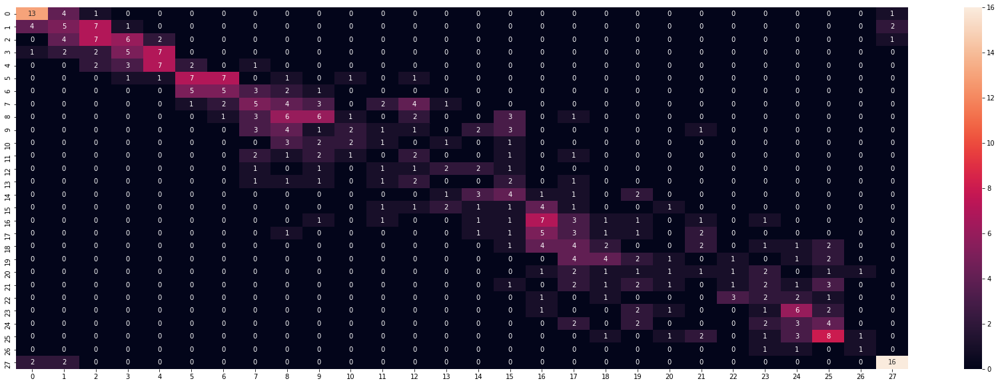

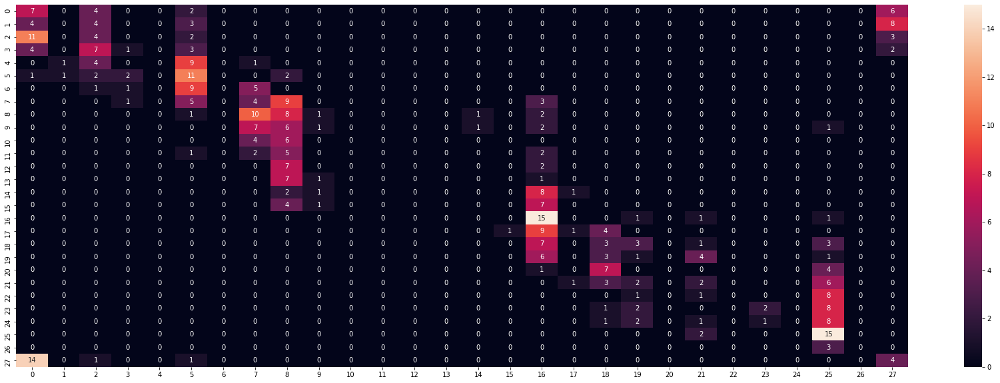

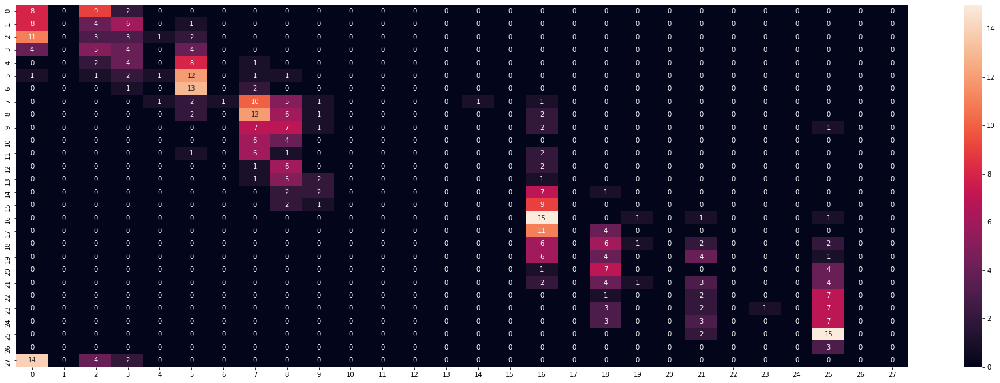

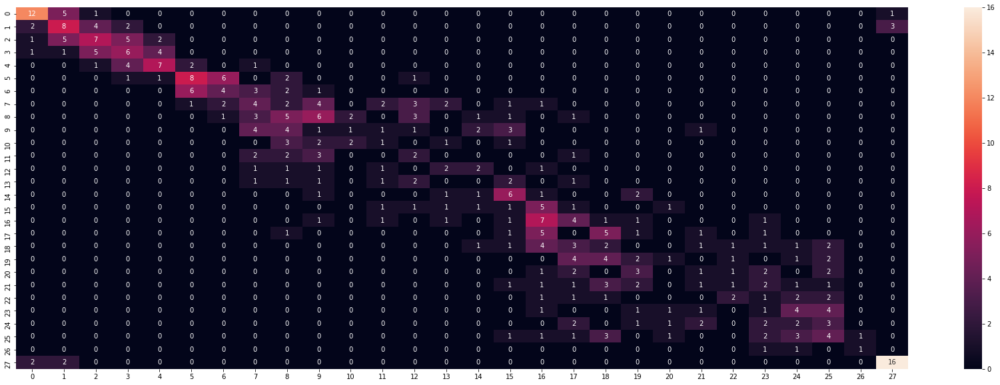

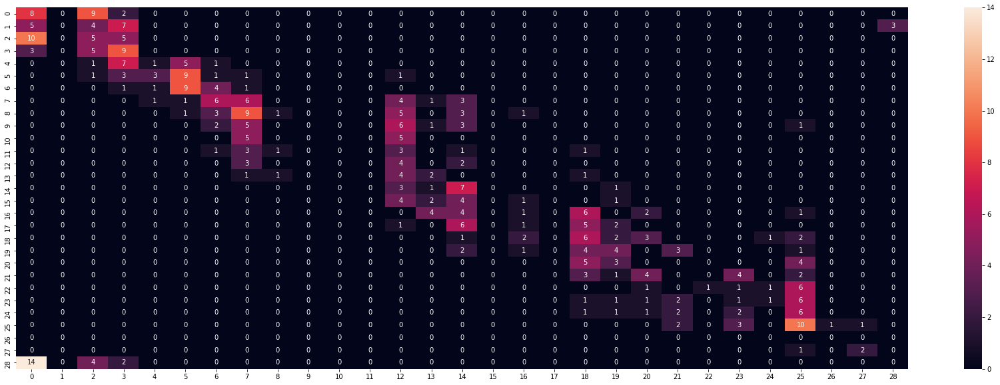

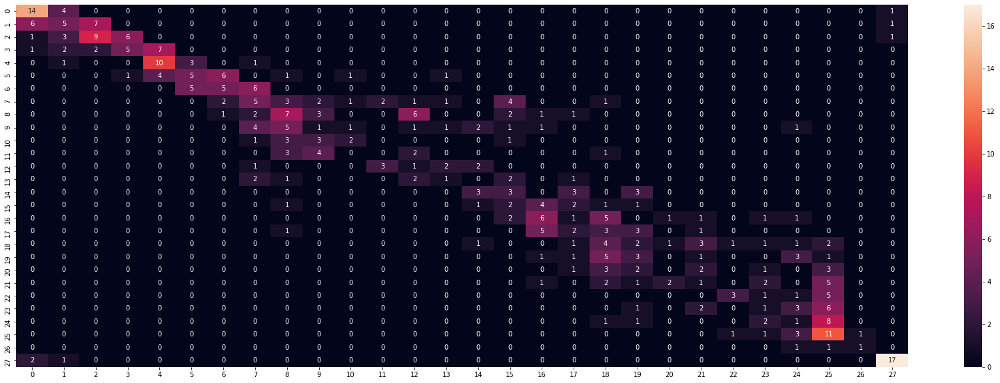

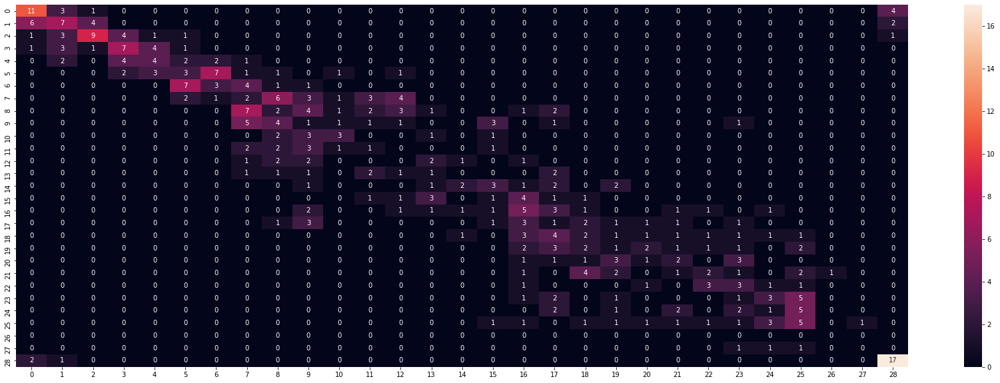

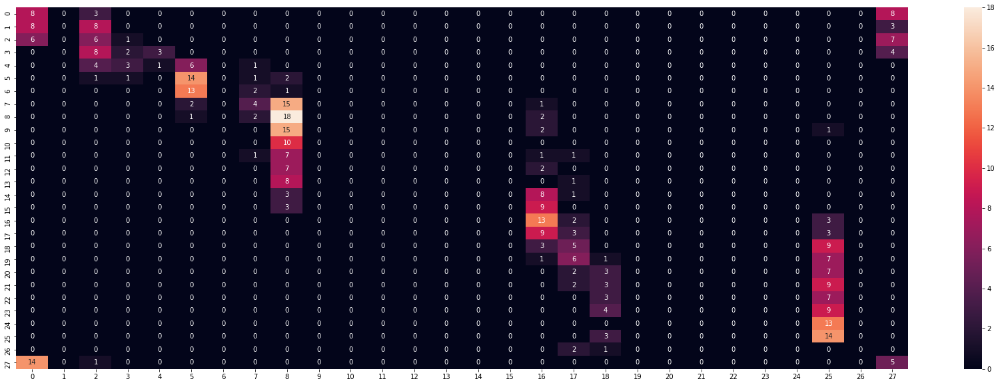

In [ ]:
e1,f1,g1,h1=call_classify(scaled_X,y) 

result_best_feature = pd.DataFrame(
    {'Classifier': classif,
     'Accuracy': e1,
     'Precision': f1,
     'Recall': g1,
     'F1-score': h1,
    })

result_best_feature

## Check both lexical and d-level with the best classifier (Extra tree classififer)

In [ ]:
classification_file_2.shape
# classification_file_2.head()

(2086, 43)

In [ ]:
# y =  classification_file_2.Level_en.astype(int)
y =  classification_file_2.Level_en
X =  classification_file_2.drop('Level_en',axis=1)
scaler=StandardScaler()
scaled_X = scaler.fit_transform(X)

In [ ]:
DF_list= list()

def classify(X,y,classifier): 
    kf = StratifiedKFold(n_splits=5,shuffle=True,random_state=100)                                ############changed
    acc_score=[]
    prec_score =[]
    f_score =[]
    reca_score =[]
    i=1

    classifier_check = []                                                                           ############changed

    for train_index,test_index in kf.split(X,y):
        #print('{} of KFold {}'.format(i,kf.n_splits))
        # print(train_index)
        # xtr,xvl = np.take(X, train_index), np.take(X, test_index)  #X[train_index],X[test_index]
        # ytr,yvl = np.take(y, train_index), np.take(y, test_index)  # y[train_index],y[test_index]
        xtr,xvl = X[train_index],X[test_index]
        ytr,yvl = y[train_index],y[test_index]
        # print(ytr)
        # print(f"Unique training: {np.unique(ytr)}")
        # print(f"Unique validation {np.unique(yvl)}")
        #model
        clfr = classifier
        clfr.fit(xtr,ytr)
        pred2= clfr.predict(xvl) 
        Accuracy= accuracy_score(yvl, pred2)
        #confusion matrix',confusion_matrix(yvl, pred))
        recall = metrics.recall_score(yvl, pred2,average= 'macro')
        precision = metrics.precision_score(yvl, pred2,average= 'macro')
        fscore=metrics.f1_score(yvl, pred2,average= 'macro')
        # print(metrics.confusion_matrix(yvl,pred2))
        classifier_check = [ yvl, pred2]                                                                 ############changed

        #print('confusion matrix',confusion_matrix(yvl, pred2))
        #print('precision_recall_fscore_support',precision_recall_fscore_support(yvl, pred2))
        acc_score.append(Accuracy)
        prec_score.append(precision)
        reca_score.append(recall)
        f_score.append(fscore)

        classifier_check.append(classifier_check)

        i+=1
    e = (sum(acc_score)/len(acc_score))
    f= (sum(prec_score)/len(prec_score))
    g=(sum(reca_score)/len(reca_score))
    h=(sum(f_score)/len(f_score))

    conf_matrix = confusion_matrix(yvl,pred2)
    df_cm = pd.DataFrame(conf_matrix)
    df_cm
    # DF_list.append(df_cm)
   
    plt.figure(figsize = (30,10))
    sn.heatmap(df_cm, annot=True)

    print(classifier,':')
    print('\033[1m'+'Average of all Precision :' +'\033[0m',f)
    print('\033[1m'+'Average of all Accuracy :' +'\033[0m',e)
    print('\033[1m'+'Average of all Recall :' +'\033[0m',g)
    print('\033[1m'+'Average of all F1-score :' +'\033[0m',h)
    return e,f,g,h,classifier_check
    

ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100,
                     n_jobs=None, oob_score=False, random_state=100, verbose=0,
                     warm_start=False) :
Average of all Precision : 0.33890766283699436
Average of all Accuracy : 0.36240519546085614
Average of all Recall : 0.33378390388534696
Average of all F1-score : 0.3275427848223086


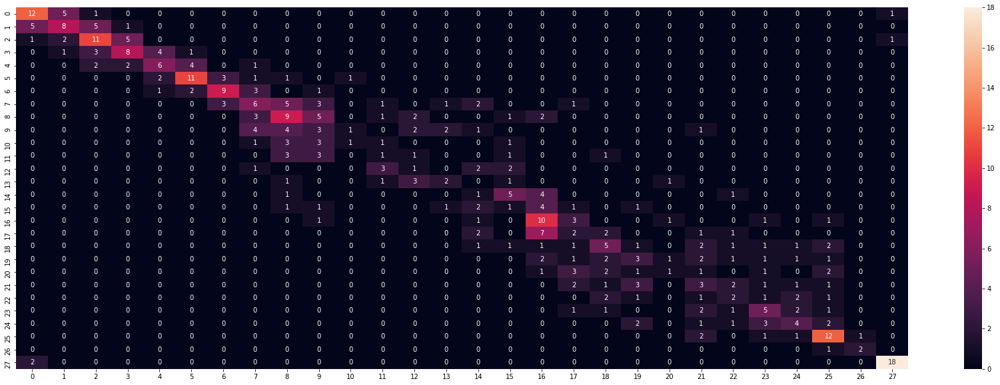

In [ ]:
def call_classify(X,y):   
    accuracy=[]
    avg_precision=[]
    recall=[]
    f_score=[]

    classifier_check_2 = []                                                                    ############changed

    classifiers = [ExtraTreesClassifier(n_estimators=100, random_state=100)]
    for classifier in (classifiers):
            e,f,g,h,classifier_check = classify(X,y,classifier)                                    ############changed
            accuracy.append(e*100)
            avg_precision.append(f*100)
            recall.append(g*100)
            f_score.append(h*100)
            classifier_check_2.append(classifier_check)
    return accuracy,f_score,avg_precision,recall,classifier_check_2                               ############changed
classif = ['Extratrees classifier']        

e1,f1,g1,h1,classifier_check_3 =call_classify(scaled_X,y)                                          ############changed

## extratree only with lexical


In [ ]:
classification_file_lex = classification_file_2[[  
                                             'wordtypes', 'swordtypes','lextypes', 'slextypes', 'wordtokens', 'swordtokens', 'lextokens','slextokens', 'ld', 'ls1', 'ls2', 
                                             'vs1', 'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr', 'cttr', 
                                             'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2', 'nv', 'adjv' , 'advv', 'modv', 'Level_en' ]]
type(classification_file_2)
classification_file_lex.head()
# classification_file_lex.shape



,wordtypes,swordtypes,lextypes,slextypes,wordtokens,swordtokens,lextokens,slextokens,ld,ls1,ls2,vs1,vs2,cvs1,ndw,ndwz,ndwerz,ndwesz,ttr,msttr,cttr,rttr,logttr,uber,lv,vv1,svv1,cvv1,vv2,nv,adjv,advv,modv,Level_en
0,33,8,20,8,64,17,39,17,0.61,0.44,0.24,0.07,0.07,0.19,33,22,27.6,27.1,0.52,0.44,2.92,4.12,0.84,11.34,0.51,0.36,1.79,0.94,0.13,0.60,0.00,0.00,0.00,0
1,11,6,9,6,32,6,16,6,0.50,0.38,0.55,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,0.56,0.00,0.00,0.00,0.00,0.12,0.50,0.00,0.50,0
2,30,4,19,4,57,13,28,13,0.49,0.46,0.13,0.00,0.00,0.00,30,24,26.4,26.4,0.53,0.48,2.81,3.97,0.84,11.06,0.68,1.00,4.00,1.41,0.14,0.47,0.21,0.04,0.25,0
3,34,7,22,7,51,14,29,14,0.57,0.48,0.21,0.18,0.36,0.43,34,33,33.3,33.4,0.67,0.66,3.37,4.76,0.90,16.56,0.76,1.00,11.00,2.35,0.38,0.56,0.07,0.00,0.07,0
4,11,7,8,7,32,7,8,7,0.25,0.88,0.64,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0


ExtraTreesClassifier(bootstrap=False, ccp_alpha=0.0, class_weight=None,
                     criterion='gini', max_depth=None, max_features='auto',
                     max_leaf_nodes=None, max_samples=None,
                     min_impurity_decrease=0.0, min_impurity_split=None,
                     min_samples_leaf=1, min_samples_split=2,
                     min_weight_fraction_leaf=0.0, n_estimators=100,
                     n_jobs=None, oob_score=False, random_state=100, verbose=0,
                     warm_start=False) :
Average of all Precision : 0.32327598166699056
Average of all Accuracy : 0.3499489403692357
Average of all Recall : 0.3231380495820831
Average of all F1-score : 0.31573934619651534


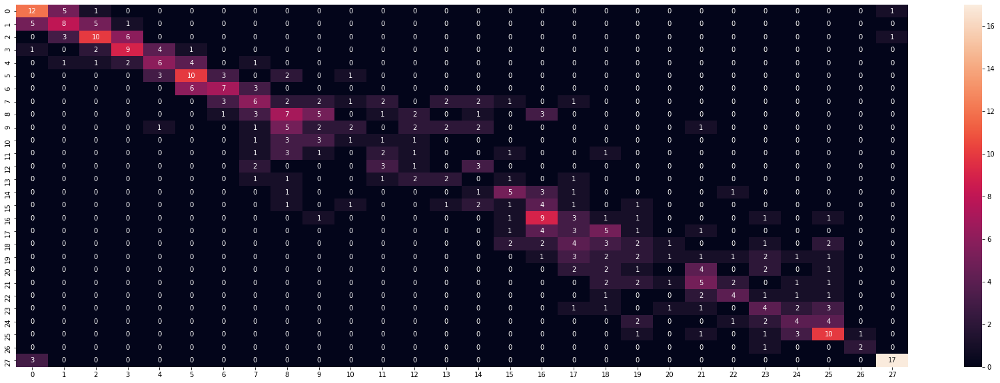

In [ ]:
y =  classification_file_lex.Level_en
X =  classification_file_lex.drop('Level_en',axis=1)
scaler=StandardScaler()
scaled_X = scaler.fit_transform(X)


e1,f1,g1,h1,classifier_check_3 =call_classify(scaled_X,y) 

In [ ]:
# type(classifier_check_3)
# classifier_check_3[0][0]

In [ ]:
test_index = classifier_check_3[0][0]
prediction = classifier_check_3[0][1]

df1 = test_index.to_frame()
df1.reset_index(inplace=True)
df1 = df1.rename(columns = {'index':'Original index'})

df2 = pd.DataFrame(prediction, columns = ['prediction'])

df3 = df1.join(df2)

df4 = df3['Level_en'].compare(df3['prediction'])

df5 = df3.join(df4).dropna()

df5

,Original index,Level_en,prediction,self,other
2,13,0,1,0.0,1.0
4,18,0,1,0.0,1.0
5,19,0,2,0.0,2.0
6,33,0,1,0.0,1.0
7,38,0,1,0.0,1.0
...,...,...,...,...,...
395,1983,18,25,18.0,25.0
396,1984,19,23,19.0,23.0
398,1996,28,0,28.0,0.0
404,2010,28,0,28.0,0.0


In [ ]:
# classification_file['text_modified_2'] = [sub.replace("<start>", "") for sub in classification_file['text_modified']]

lex_check_file = classification_file[['Level',  
                                             'wordtypes', 'swordtypes','lextypes', 'slextypes', 'wordtokens', 'swordtokens', 'lextokens','slextokens', 'ld', 'ls1', 'ls2', 
                                             'vs1', 'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr', 'cttr', 
                                             'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2', 'nv', 'adjv' , 'advv', 'modv',
                                      'Level0', 'Level1', 'Level2','Level3', 'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel','text_modified']]

lex_check_file['text_modified_2'] = [sub.replace("<start>", "") for sub in lex_check_file['text_modified']]


lex_check_file_2 = lex_check_file.dropna(subset= ['Level',  
                                             'wordtypes', 'swordtypes','lextypes', 'slextypes', 'wordtokens', 'swordtokens', 'lextokens','slextokens', 'ld', 'ls1', 'ls2', 
                                             'vs1', 'vs2', 'cvs1', 'ndw', 'ndwz', 'ndwerz', 'ndwesz', 'ttr', 'msttr', 'cttr', 
                                             'rttr', 'logttr', 'uber', 'lv', 'vv1', 'svv1', 'cvv1', 'vv2', 'nv', 'adjv' , 'advv', 'modv',
                                             'Level0', 'Level1', 'Level2','Level3', 'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel'])
lex_check_file_2 = lex_check_file_2.reset_index(drop=True)
lex_check_file_2.drop(["text_modified_2","text_modified"], axis=1, inplace =True)

lex_check_file_2["Level"] = lex_check_file_2["Level"].astype(str)
le = preprocessing.LabelEncoder()
le.fit(lex_check_file_2['Level'])
lex_check_file_2["Level_en"] = pd.Series(le.transform(lex_check_file_2['Level']))   # label encoded
lex_check_file_2 = lex_check_file_2.dropna(subset= ["Level_en"])
lex_check_file_2 = lex_check_file_2[~lex_check_file_2.isin(['NaN']).any(axis =1)]
lex_check_file_3 = lex_check_file_2.copy(deep=True)
lex_check_file_3.drop(["Level",'Level0', 'Level1', 'Level2','Level3', 'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel'], axis=1, inplace =True)

lex_check_file_3.head()
# lex_check_file_2.shape()

# lex_check_file_2.to_csv('features_checking.csv', index=True)

,wordtypes,swordtypes,lextypes,slextypes,wordtokens,swordtokens,lextokens,slextokens,ld,ls1,ls2,vs1,vs2,cvs1,ndw,ndwz,ndwerz,ndwesz,ttr,msttr,cttr,rttr,logttr,uber,lv,vv1,svv1,cvv1,vv2,nv,adjv,advv,modv,Level_en
0,33,8,20,8,64,17,39,17,0.61,0.44,0.24,0.07,0.07,0.19,33,22,27.6,27.1,0.52,0.44,2.92,4.12,0.84,11.34,0.51,0.36,1.79,0.94,0.13,0.60,0.00,0.00,0.00,0
1,11,6,9,6,32,6,16,6,0.50,0.38,0.55,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,0.56,0.00,0.00,0.00,0.00,0.12,0.50,0.00,0.50,0
2,30,4,19,4,57,13,28,13,0.49,0.46,0.13,0.00,0.00,0.00,30,24,26.4,26.4,0.53,0.48,2.81,3.97,0.84,11.06,0.68,1.00,4.00,1.41,0.14,0.47,0.21,0.04,0.25,0
3,34,7,22,7,51,14,29,14,0.57,0.48,0.21,0.18,0.36,0.43,34,33,33.3,33.4,0.67,0.66,3.37,4.76,0.90,16.56,0.76,1.00,11.00,2.35,0.38,0.56,0.07,0.00,0.07,0
4,11,7,8,7,32,7,8,7,0.25,0.88,0.64,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0


In [ ]:
lex_check_file.head()

,Level,wordtypes,swordtypes,lextypes,slextypes,wordtokens,swordtokens,lextokens,slextokens,ld,ls1,ls2,vs1,vs2,cvs1,ndw,ndwz,ndwerz,ndwesz,ttr,msttr,cttr,rttr,logttr,uber,lv,vv1,svv1,cvv1,vv2,nv,adjv,advv,modv,Level0,Level1,Level2,Level3,Level4,Level5,Level6,Level7,MeanLevel,text_modified,text_modified_2
0,A,33,8,20,8,64,17,39,17,0.61,0.44,0.24,0.07,0.07,0.19,33,22,27.6,27.1,0.52,0.44,2.92,4.12,0.84,11.34,0.51,0.36,1.79,0.94,0.13,0.60,0.00,0.00,0.00,8,0,0,1,0,0,0,2,17.0,Fred sees a bed. <start> Fred sees a hat. <sta...,Fred sees a bed. Fred sees a hat. Fred sees ...
1,A,11,6,9,6,32,6,16,6,0.50,0.38,0.55,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,0.56,0.00,0.00,0.00,0.00,0.12,0.50,0.00,0.50,8,0,0,0,0,0,0,0,0.0,This face is happy. <start> This face is sad. ...,This face is happy. This face is sad. This f...
2,A,30,4,19,4,57,13,28,13,0.49,0.46,0.13,0.00,0.00,0.00,30,24,26.4,26.4,0.53,0.48,2.81,3.97,0.84,11.06,0.68,1.00,4.00,1.41,0.14,0.47,0.21,0.04,0.25,12,0,0,0,0,0,0,0,0.0,This button is round. <start> This button is s...,This button is round. This button is square. ...
3,A,34,7,22,7,51,14,29,14,0.57,0.48,0.21,0.18,0.36,0.43,34,33,33.3,33.4,0.67,0.66,3.37,4.76,0.90,16.56,0.76,1.00,11.00,2.35,0.38,0.56,0.07,0.00,0.07,7,0,1,1,0,1,0,0,5.0,Some athletes run. <start> Some athletes jump....,Some athletes run. Some athletes jump. Some ...
4,A,11,7,8,7,32,7,8,7,0.25,0.88,0.64,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,8,0,0,0,0,0,0,0,0.0,This is a kitten. <start> This is a puppy. <st...,This is a kitten. This is a puppy. This is a...


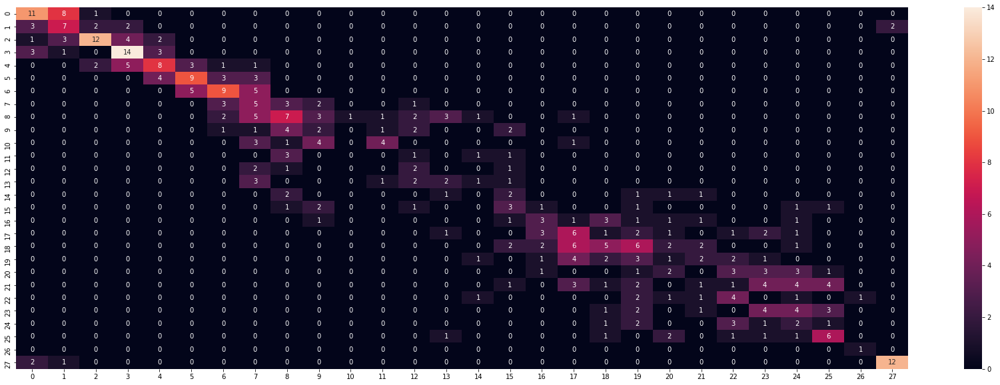

In [ ]:
y =  lex_check_file_3.Level_en
X =  lex_check_file_3.drop('Level_en',axis=1)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)    ### change to level encoding/grade encoding
clfr = ExtraTreesClassifier(n_estimators=100, random_state=100)
clfr.fit(X_train,y_train)
pred2= clfr.predict(X_test) 
conf_matrix = confusion_matrix(y_test,pred2)
df_cm = pd.DataFrame(conf_matrix)
df_cm
# DF_list.append(df_cm)

plt.figure(figsize = (30,10))
sn.heatmap(df_cm, annot=True)

In [ ]:
pred2
df1_lex = y_test.to_frame()
df1_lex.reset_index(inplace=True)
df1_lex = df1_lex.rename(columns = {'index':'Original_index_lex'})
df2_lex = pd.DataFrame(pred2, columns = ['prediction_lex'])

df3_lex = df1_lex.join(df2_lex)

df4_lex = df3_lex['Level_en'].compare(df3_lex['prediction_lex'])

df5_lex = df3_lex.join(df4_lex).dropna()

df5_lex

,Original_index_lex,Level_en,prediction_lex,self,other
2,382,4,5,4.0,5.0
4,1709,23,21,23.0,21.0
5,966,9,12,9.0,12.0
6,237,2,4,2.0,4.0
8,613,4,7,4.0,7.0
...,...,...,...,...,...
409,1040,13,12,13.0,12.0
411,583,6,5,6.0,5.0
414,701,5,7,5.0,7.0
415,1717,23,24,23.0,24.0


### lets now do for d- level

## randome state has been kept same for both case to maintain the same train test split

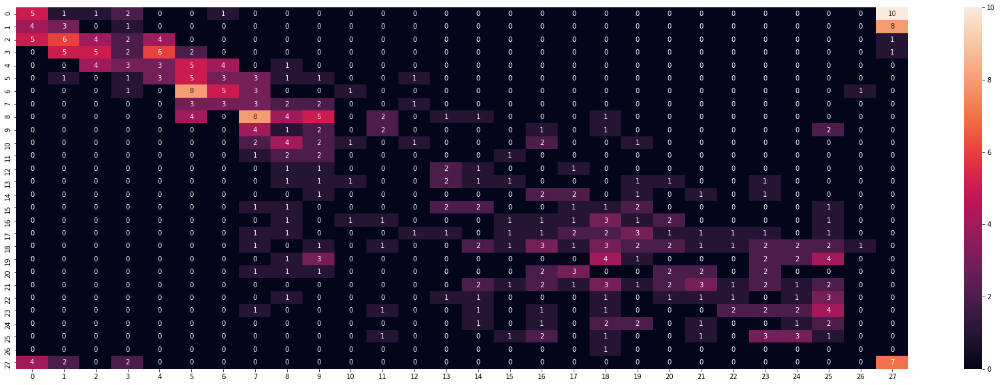

In [ ]:
dlevel_check_file_2 = lex_check_file_2 [['Level_en',  'Level0', 'Level1', 'Level2','Level3', 'Level4', 'Level5', 'Level6', 'Level7', 'MeanLevel']]

y =  dlevel_check_file_2.Level_en
X =  dlevel_check_file_2.drop('Level_en',axis=1)


X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)    ### change to level encoding/grade encoding
clfr = ExtraTreesClassifier(n_estimators=100, random_state=100)
clfr.fit(X_train,y_train)
pred2= clfr.predict(X_test) 
conf_matrix = confusion_matrix(y_test,pred2)
df_cm = pd.DataFrame(conf_matrix)
df_cm
# DF_list.append(df_cm)

plt.figure(figsize = (30,10))
sn.heatmap(df_cm, annot=True)

In [ ]:
type(y_test)

pandas.core.series.Series

In [ ]:
pred2
df1_dlevel = y_test.to_frame()
df1_dlevel.reset_index(inplace=True)
df1_dlevel = df1_dlevel.rename(columns = {'index':'Original_index_dlevel'})
df2_dlevel = pd.DataFrame(pred2, columns = ['prediction_dlevel'])

df3_dlevel = df1_dlevel.join(df2_dlevel)

df4_dlevel = df3_dlevel['Level_en'].compare(df3_dlevel['prediction_dlevel'])

df5_dlevel = df3_dlevel.join(df4_dlevel).dropna()

df5_dlevel

,Original_index_dlevel,Level_en,prediction_dlevel,self,other
0,865,8,7,8.0,7.0
1,819,7,5,7.0,5.0
2,382,4,5,4.0,5.0
3,584,6,5,6.0,5.0
4,1709,23,25,23.0,25.0
...,...,...,...,...,...
413,1668,22,13,22.0,13.0
414,701,5,7,5.0,7.0
415,1717,23,22,23.0,22.0
416,1674,16,18,16.0,18.0


In [ ]:

df3_lex

,Original_index_lex,Level_en,prediction_lex
0,865,8,8
1,819,7,7
2,382,4,5
3,584,6,6
4,1709,23,21
...,...,...,...
413,1668,22,22
414,701,5,7
415,1717,23,24
416,1674,16,24


In [ ]:
df3_dlevel

,Original_index_dlevel,Level_en,prediction_dlevel
0,865,8,7
1,819,7,5
2,382,4,5
3,584,6,5
4,1709,23,25
...,...,...,...
413,1668,22,13
414,701,5,7
415,1717,23,22
416,1674,16,18


In [ ]:
df3_lex_dlevel = df3_lex.join(df3_dlevel, lsuffix='_left', rsuffix='_right')
# df3_lex_dlevel = pd.concat([df3_lex,df3_dlevel])
df3_lex_dlevel

,Original_index_lex,Level_en_left,prediction_lex,Original_index_dlevel,Level_en_right,prediction_dlevel
0,865,8,8,865,8,7
1,819,7,7,819,7,5
2,382,4,5,382,4,5
3,584,6,6,584,6,5
4,1709,23,21,1709,23,25
...,...,...,...,...,...,...
413,1668,22,22,1668,22,13
414,701,5,7,701,5,7
415,1717,23,24,1717,23,22
416,1674,16,24,1674,16,18


In [ ]:
dfcheck = df3_lex_dlevel['Original_index_lex'].compare(df3_lex_dlevel['Original_index_dlevel'])
dfcheck

,self,other


In [ ]:
df4_lex

,self,other
2,4.0,5.0
4,23.0,21.0
5,9.0,12.0
6,2.0,4.0
8,4.0,7.0
...,...,...
409,13.0,12.0
411,6.0,5.0
414,5.0,7.0
415,23.0,24.0


In [ ]:
df3_lex_dlevel['Original_index_lex'][417] -df3_lex_dlevel['Original_index_dlevel'][417]
a1 = df3_lex_dlevel.copy(deep=True)
a1.set_index('Original_index_lex')
a1

,Original_index_lex,Level_en_left,prediction_lex,Original_index_dlevel,Level_en_right,prediction_dlevel
0,865,8,8,865,8,7
1,819,7,7,819,7,5
2,382,4,5,382,4,5
3,584,6,6,584,6,5
4,1709,23,21,1709,23,25
...,...,...,...,...,...,...
413,1668,22,22,1668,22,13
414,701,5,7,701,5,7
415,1717,23,24,1717,23,22
416,1674,16,24,1674,16,18


In [ ]:
# lex_check_file
# a1 = df1.join(lex_check_file)
# a1



In [ ]:
df4_dlevel

,self,other
0,8.0,7.0
1,7.0,5.0
2,4.0,5.0
3,6.0,5.0
4,23.0,25.0
...,...,...
413,22.0,13.0
414,5.0,7.0
415,23.0,22.0
416,16.0,18.0


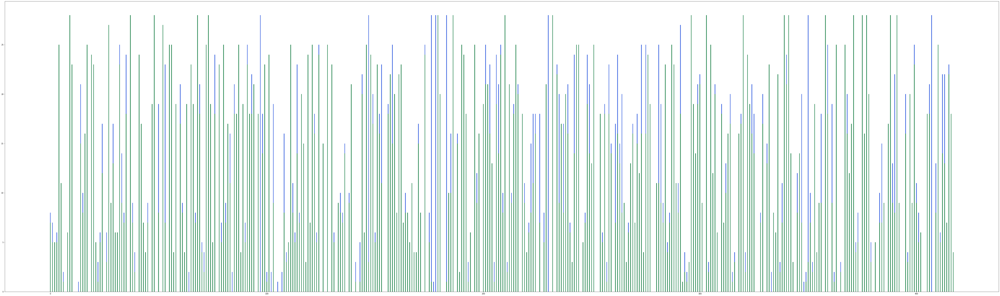

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

width = 0.3       

fig = plt.figure(figsize = (100,30))

ax = fig.add_subplot(111)
rects1 = ax.bar( df4_dlevel.index.values, df4_dlevel['self'], width, color='royalblue')


rects2 = ax.bar(df4_dlevel.index.values, df4_dlevel['other'], width, color='seagreen')



plt.show()

In [ ]:
sub_8

,Original_index_lex,Level_en_left,prediction_lex,Original_index_dlevel,Level_en_right,prediction_dlevel
0,865,8,8,865,8,7
34,1102,8,17,1102,8,7
67,744,8,6,744,8,7
86,1118,8,13,1118,8,18
115,707,8,7,707,8,7
133,881,8,7,881,8,9
135,1087,8,13,1087,8,7
140,873,8,12,873,8,8
175,736,8,8,736,8,5
204,1113,8,13,1113,8,13


In [ ]:
sub_8 = a1[a1["Level_en_left"] == 8]
sub_8
print(sub_8.shape)
print(len(sub_8[sub_8.prediction_lex > 8]))
print(len(sub_8[sub_8.prediction_lex < 8]))
print(len(sub_8[sub_8.prediction_dlevel > 8]))
print(len(sub_8[sub_8.prediction_dlevel < 8]))

(26, 6)
12
7
10
12


In [ ]:
sub_1

,Original_index_lex,Level_en_left,prediction_lex,Original_index_dlevel,Level_en_right,prediction_dlevel
13,100,1,3,100,1,0
37,184,1,1,184,1,28
48,128,1,0,128,1,28
105,109,1,1,109,1,0
106,120,1,1,120,1,1
127,111,1,0,111,1,1
137,124,1,28,124,1,1
177,135,1,0,135,1,0
179,99,1,1,99,1,28
186,188,1,1,188,1,28


In [ ]:
sub_1 = a1[a1["Level_en_left"] == 1]
print(sub_1.shape)
print(len(sub_1[sub_1.prediction_lex > 1]))
print(len(sub_1[sub_1.prediction_lex < 1]))
print(len(sub_1[sub_1.prediction_dlevel > 1]))
print(len(sub_1[sub_1.prediction_dlevel < 1]))

(16, 6)
6
3
9
4


In [ ]:
sub_27 = a1[a1["Level_en_left"] == 27]
sub_27
print(sub_27.shape)
print(len(sub_27[sub_27.prediction_lex > 27]))
print(len(sub_27[sub_27.prediction_lex < 27]))
print(len(sub_27[sub_27.prediction_dlevel > 27]))
print(len(sub_27[sub_27.prediction_dlevel < 27]))

(1, 6)
0
0
0
1


In [ ]:
sub_21

,Original_index_lex,Level_en_left,prediction_lex,Original_index_dlevel,Level_en_right,prediction_dlevel
11,1549,21,24,1549,21,21
14,1593,21,24,1593,21,15
17,1605,21,19,1605,21,25
41,1985,21,25,1985,21,24
60,1575,21,17,1575,21,17
69,1591,21,17,1591,21,18
85,1557,21,25,1557,21,18
99,1554,21,21,1554,21,23
155,1540,21,23,1540,21,21
182,1552,21,15,1552,21,21


In [ ]:
sub_21 = a1[a1["Level_en_left"] == 21]
len(sub_21["prediction_lex"] >21) 
sub_21["prediction_lex"] >21
type(sub_21["prediction_lex"] >21 )
sub_21
print(sub_21.shape)
print(len(sub_21[sub_21.prediction_lex > 21]))
print(len(sub_21[sub_21.prediction_lex < 21]))
print(len(sub_21[sub_21.prediction_dlevel > 21]))
print(len(sub_21[sub_21.prediction_dlevel < 21]))

(21, 6)
13
7
6
12


In [ ]:
lex_check_file.head()

,Level,wordtypes,swordtypes,lextypes,slextypes,wordtokens,swordtokens,lextokens,slextokens,ld,ls1,ls2,vs1,vs2,cvs1,ndw,ndwz,ndwerz,ndwesz,ttr,msttr,cttr,rttr,logttr,uber,lv,vv1,svv1,cvv1,vv2,nv,adjv,advv,modv,Level0,Level1,Level2,Level3,Level4,Level5,Level6,Level7,MeanLevel,text_modified,text_modified_2
0,A,33,8,20,8,64,17,39,17,0.61,0.44,0.24,0.07,0.07,0.19,33,22,27.6,27.1,0.52,0.44,2.92,4.12,0.84,11.34,0.51,0.36,1.79,0.94,0.13,0.60,0.00,0.00,0.00,8,0,0,1,0,0,0,2,17.0,Fred sees a bed. <start> Fred sees a hat. <sta...,Fred sees a bed. Fred sees a hat. Fred sees ...
1,A,11,6,9,6,32,6,16,6,0.50,0.38,0.55,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,0.56,0.00,0.00,0.00,0.00,0.12,0.50,0.00,0.50,8,0,0,0,0,0,0,0,0.0,This face is happy. <start> This face is sad. ...,This face is happy. This face is sad. This f...
2,A,30,4,19,4,57,13,28,13,0.49,0.46,0.13,0.00,0.00,0.00,30,24,26.4,26.4,0.53,0.48,2.81,3.97,0.84,11.06,0.68,1.00,4.00,1.41,0.14,0.47,0.21,0.04,0.25,12,0,0,0,0,0,0,0,0.0,This button is round. <start> This button is s...,This button is round. This button is square. ...
3,A,34,7,22,7,51,14,29,14,0.57,0.48,0.21,0.18,0.36,0.43,34,33,33.3,33.4,0.67,0.66,3.37,4.76,0.90,16.56,0.76,1.00,11.00,2.35,0.38,0.56,0.07,0.00,0.07,7,0,1,1,0,1,0,0,5.0,Some athletes run. <start> Some athletes jump....,Some athletes run. Some athletes jump. Some ...
4,A,11,7,8,7,32,7,8,7,0.25,0.88,0.64,0.00,0.00,0.00,11,11,11.0,11.0,0.34,0.34,1.38,1.94,0.69,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,8,0,0,0,0,0,0,0,0.0,This is a kitten. <start> This is a puppy. <st...,This is a kitten. This is a puppy. This is a...


In [ ]:
lex_check_file['text_modified_2'].iloc[124] #level 28 - lex # level 1 -d-level

'Many animals live in the Gobi Desert.  Camels live in the Gobi.  Eagles live in the Gobi.  Grasshoppers live in the Gobi.  Horses live in the Gobi.  Goats live in the Gobi.  Wolves live in the Gobi.  Lizards live in the Gobi.  Sort the animals from the book into groups. Write a label for each group.  Look at a world map with your class. Find where you live. How would you get to the Gobi Desert? '

In [ ]:
lex_check_file['text_modified_2'].iloc[120] #level 1

'I tried catching one Monday.  I tried catching one Tuesday.  I tried catching one Wednesday.  I tried catching one Thursday.  I tried catching one Friday.  I tried catching one Saturday.  I tried catching one Sunday.  I caught one and let it go. '

In [ ]:
lex_check_file['text_modified_2'].iloc[173] #level 28

'This chair is too high.  This hook is too high.  This shelf is too high.  This sink is too high.  This tree is too high.  This roof is too high.  This hoop is too high.  This head is just right.  What is something that is too high for you? Draw a picture and label it.   How would you help the boy? Share your ideas with a partner.  '

In [ ]:
lex_check_file['text_modified_2'].iloc[162] #level 3

'Ten cats have ten bows.  Ten boys have ten jugs.  Ten trees have ten crows.  Ten girls have ten bugs.  Ten dogs have ten noses.  Ten dads have ten mugs.  Ten plants have ten roses.  Ten moms give ten hugs. '

d-level mis classification

In [ ]:
lex_check_file['text_modified_2'].iloc[184] #level 28

'What flies in the sky?  A kite flies in the sky.  A bird flies in the sky.  A balloon flies in the sky.  A bee flies in the sky.  A rocket flies in the sky.  A bat flies in the sky. '

In [ ]:
lex_check_file['text_modified_2'].iloc[128] #level 28

'Henry hikes into the park.  Henry hikes on the trail.  Henry hikes around the pond.  Henry hikes in the mud.  Henry hikes up the hill.  Henry hikes past the deer.  Henry hikes down the hill.  Henry hikes to the car.  What other animals could Henry see on his hike? Draw a picture and write about them.  Which season do you think would be the best for hiking where you live? Why? Share your ideas with a partner. '

In [ ]:
lex_check_file['text_modified_2'].iloc[111] #level 0 lex level 1 dlevel

'Bananas sometimes look like hands.  Bananas sometimes look like boats.  Bananas sometimes look like pencils.  Bananas sometimes look like spiders.  Bananas sometimes look like telephones.  Bananas sometimes look like smiles.  Bananas sometimes look like frowns.  Bananas always look good to eat. '